<center>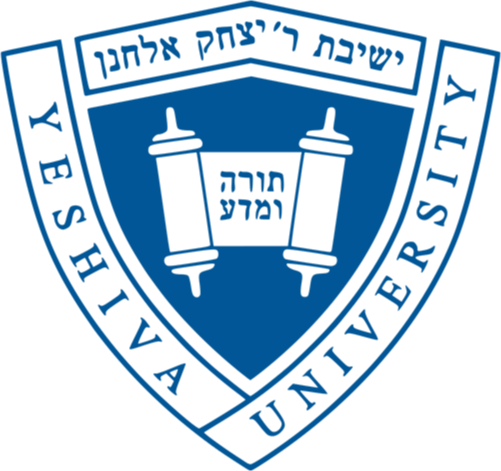</center>

<h1 style='text-align: center;'>Katz School of Science and Health</h1>
<h1 style='text-align: center;'>AIM 5000 Artificial Intelligence</h1>
<p>
<h2 style='text-align: center;'>Final Project</h1>
<br><br>
<h2 style='text-align: center;'>From Cells to Answers: The New Frontier of Visual Question Answering in Pathology</h1>
<br><br>

<div style="display: flex; justify-content: center;">
    <table style="border-collapse: collapse; border: 0;">
        <tr>
            <td style="text-align:center; vertical-align:middle; padding:10px 40px 10px 10px; border: 0;">
                <h3 style="margin: 0;">Sheng-Han Yueh</h3>
            </td>
            <td style="text-align:center; vertical-align:middle; padding:10px 10px 10px 40px; border: 0;">
                <h3 style="margin: 0;">Radek Jan Holik</h3>
            </td>
            <td style="text-align:center; vertical-align:middle; padding:10px 10px 10px 40px; border: 0;">
                <h3 style="margin: 0;">Jiuge Ren</h3>
            </td>
            <td style="text-align:center; vertical-align:middle; padding:10px 10px 10px 40px; border: 0;">
                <h3 style="margin: 0;">Sayed Raheel Hussain</h3>
            </td>
        </tr>
    </table>
</div>
<br>
<br>
<br>

# __Package Import__

In [1]:
# General system and utility libraries
import platform
from datetime import datetime, timedelta
from timeit import default_timer as timer
import psutil
import win32com.client


# Data manipulation and analysis libraries
import pandas as pd
import numpy as np
import pickle
from wordcloud import WordCloud
# from collections import Counter
# from sklearn.model_selection import train_test_split

# # Image processing libraries
from PIL import Image
import seaborn as sns
from wordcloud import WordCloud

# # Network and web-related libraries
# import requests

# Machine learning and deep learning libraries
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset, random_split
from torch.nn.utils.rnn import pad_sequence
import torch.nn.functional as F
import torchvision
from torchvision import transforms, models
from io import BytesIO
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm import tqdm


from torch.optim import AdamW
#!pip install 'git+https://github.com/katsura-jp/pytorch-cosine-annealing-with-warmup'
from cosine_annealing_warmup import CosineAnnealingWarmupRestarts


# Natural language processing libraries
import transformers

# Natural language processing libraries
# from transformers import Blip2Processor, Blip2ForConditionalGeneration, get_cosine_schedule_with_warmup
from transformers import BlipProcessor, Blip2ForConditionalGeneration
from transformers import T5Tokenizer

from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

# Data visualization libraries
import matplotlib.pyplot as plt

# # Metrics and evaluation libraries
# from sklearn.metrics import f1_score

# # Jupyter notebook specific libraries
# from IPython.display import clear_output

# Disable warnings for clean notebook presentation
import warnings
warnings.filterwarnings("ignore")

# Configuration for libraries
# pd.set_option('display.max_rows', 100)
# pd.set_option('display.max_colwidth', None)


In [2]:
def get_basic_system_info():
    # Get CPU Name using WMI
    wmi = win32com.client.GetObject("winmgmts:")
    for item in wmi.ExecQuery("select * from Win32_Processor"):
        cpu_name = item.Name

    # Total RAM capacity in bytes
    total_ram_bytes = psutil.virtual_memory().total

    # Convert total RAM from bytes to GB for better readability
    total_ram_gb = total_ram_bytes / (1024 ** 3)

    return cpu_name, total_ram_gb

print(f"Python Version : {platform.python_version()}")
print(f"Torchvision : {torchvision.__version__}")
print(f"PyTorch Version : {torch.__version__}")
print(f"CUDA Version : {torch.version.cuda}")

print()

os_info = platform.uname()
print(f"OS System: {os_info.system} {os_info.release}")

print()

cpu_name, total_ram_gb = get_basic_system_info()
print(f"CPU Name: {cpu_name}")
print(f"Total RAM Capacity: {total_ram_gb:.2f} GB")

print()

if torch.cuda.is_available():
  print("CUDA available. Using GPU acceleration.")
  print(f"Number of CUDA devices : {torch.cuda.device_count()}")
  print(f"Device name : {torch.cuda.get_device_name(0)}")
  device = "cuda:0"
else:
  print("CUDA is NOT available. Using CPU for training.")
  device = "cpu"

Python Version : 3.11.3
Torchvision : 0.15.2+cu118
PyTorch Version : 2.0.1+cu118
CUDA Version : 11.8

OS System: Windows 10

CPU Name: 12th Gen Intel(R) Core(TM) i9-12900K
Total RAM Capacity: 63.75 GB

CUDA available. Using GPU acceleration.
Number of CUDA devices : 1
Device name : NVIDIA GeForce RTX 3090


# __Data Analysis and Preprocessing : Explanatory Data Analysis (EDA)__

## Loading Data

In [3]:
# Data Paths
data_dir = "./data/"

vqa_path = data_dir + "metadata.csv"

## Initial inspection

In [4]:
df_vqa = pd.read_csv(vqa_path)

print(df_vqa.columns)

Index(['Image', 'Question', 'Answer', 'File_Name'], dtype='object')


In [5]:
df_vqa.head()

,Image,Question,Answer,File_Name
0,train_0422,Where are liver stem cells (oval cells) located?,in the canals of hering,./Data/Images/img_0001.jpg
1,train_0422,What are stained here with an immunohistochemi...,bile duct cells and canals of hering,./Data/Images/img_0001.jpg
2,train_0422,What are bile duct cells and canals of Hering ...,an immunohistochemical stain,./Data/Images/img_0001.jpg
3,train_0422,Are bile duct cells and canals of Hering stain...,yes,./Data/Images/img_0001.jpg
4,train_0986,What shows dissolution of the tissue?,an infarct in the brain,./Data/Images/img_0002.jpg


In [6]:
# Missing values in each column
print("Missing values in df_vqa columns:")
print(df_vqa.isnull().sum())

Missing values in df_vqa columns:
Image        0
Question     0
Answer       0
File_Name    0
dtype: int64


## <center><b>There is not a single row that is missing a value.</b></center>

In [7]:
df_vqa.describe()

,Image,Question,Answer,File_Name
count,32632,32632,32632,32632
unique,4289,11590,4922,4289
top,val_0629,What is present?,yes,./Data/Images/img_2904.jpg
freq,32,6820,8906,32


## <center><b>The dataset contains 32,632 records with unique 4,289 images, 11,590 questions and 4,922 answers.</b></center>

## __The 20 Images with the Most Questions in the Dataset:__

In [8]:
# Group by 'Image' column and count the number of questions for each image
image_question_counts = df_vqa.groupby('Image').size()

# Sort the image counts in descending order to get the images with the most questions
sorted_image_counts = image_question_counts.sort_values(ascending=False)

# Get the top 20 images with the most questions
top20_images = sorted_image_counts.head(20)

# If you need to get the actual image files or paths
top20_image_files = df_vqa[df_vqa['Image'].isin(top20_images.index)]['File_Name'].unique()

print("Top 20 images with the highest number of questions:")
print(top20_images)

Top 20 images with the highest number of questions:
Image
val_0629      32
train_1855    32
train_2073    30
val_0687      29
train_2106    28
test_0461     28
test_0458     27
train_0218    26
train_2292    25
train_1885    25
test_0611     25
train_1773    25
train_0910    24
train_1577    23
val_0642      23
train_2332    23
test_0597     23
train_1897    23
val_0695      23
val_0637      23
dtype: int64


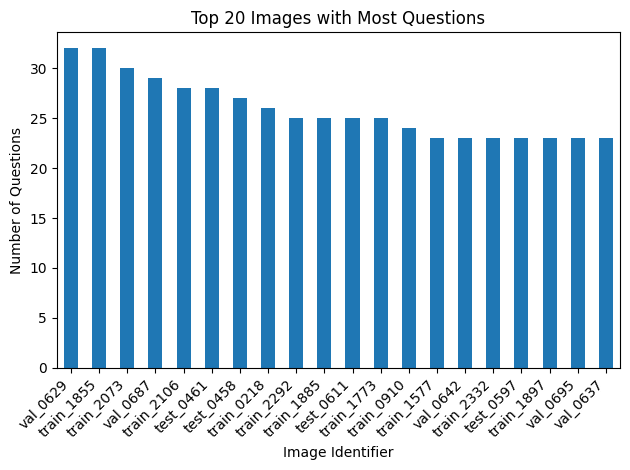

In [9]:
# Plot a bar chart
# plt.figure(figsize=(10, 8))
top20_images.plot(kind='bar')
plt.title('Top 20 Images with Most Questions')
plt.xlabel('Image Identifier')
plt.ylabel('Number of Questions')
plt.xticks(rotation=45, ha='right')  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust layout to fit labels
plt.show()

## __Histogram of Images based on Number of Questions__

In [10]:
# Group by 'Image' and count the number of questions for each image
image_question_counts = df_vqa.groupby('Image').size()

# Calculate the average number of questions per image
average_questions = image_question_counts.mean()

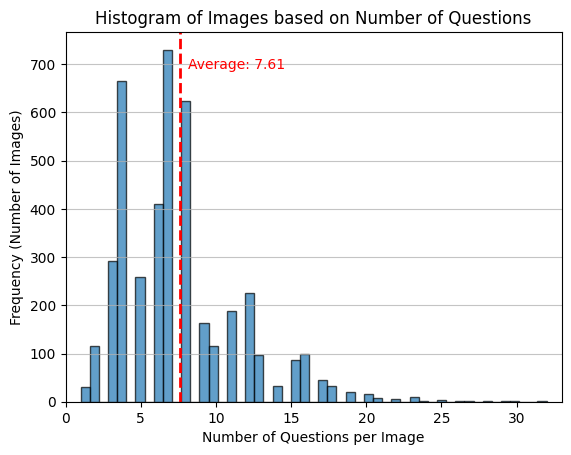

In [11]:
# Define the bins for the histogram
num_bins = 'auto'

# Now plot a histogram of the question counts
# plt.figure(figsize = (10, 6))
plt.hist(image_question_counts, bins = num_bins, edgecolor='black', alpha = 0.7)

# Draw a vertical line at the average number of questions
plt.axvline(average_questions, color = 'red', linestyle = 'dashed', linewidth = 2)

# Annotate the average line
plt.text(average_questions + 0.5, plt.ylim()[1] * 0.9, f'Average: {average_questions:.2f}', color='red')

plt.title('Histogram of Images based on Number of Questions')
plt.xlabel('Number of Questions per Image')
plt.ylabel('Frequency (Number of Images)')
plt.grid(axis='y', alpha=0.75)

# Ensure the x-axis covers the full range of question counts
plt.xlim(0, image_question_counts.max() + 1)  # set the limit to include the maximum count

plt.show()

## <center><b>Each picture has an average of 7.61 questions.<b></center>

# __Distribution Analysis of Questions and Answers__

## __The 20 Most Frequent Questions And Answers In The Dataset:__

In [12]:
# Calculate the total number of questions and answers in the dataset
total_questions = df_vqa['Question'].count()
total_answers = df_vqa['Answer'].count()

In [13]:
# Get the counts of unique questions and answers
question_counts = df_vqa['Question'].value_counts().head(20)
answer_counts = df_vqa['Answer'].value_counts().head(20)

# Calculate the percentage of each of the top 20 questions and answers
question_percent = (question_counts / total_questions) * 100
answer_percent = (answer_counts / total_answers) * 100

# Create a DataFrame for questions with counts and percentages
question_df = pd.DataFrame({
    'Counts': question_counts,
    'Percentage': question_percent
})

# Create a DataFrame for answers with counts and percentages
answer_df = pd.DataFrame({
    'Counts': answer_counts,
    'Percentage': answer_percent
})

# Display the DataFrame for the 20 most frequent questions
print("20 Most Frequent Questions:")
print(question_df)

# Display the DataFrame for the 20 most frequent answers
print("\n20 Most Frequent Answers:")
print(answer_df)

20 Most Frequent Questions:
                                   Counts  Percentage
Question                                             
What is present?                     6820   20.899730
What does this image show?           3015    9.239397
Where is this?                       1151    3.527213
Is cardiovascular present?            279    0.854989
Is oral present?                      270    0.827409
Where does this belong to?            253    0.775313
Where is this from?                   247    0.756926
Is endocrine present?                 215    0.658862
Is gastrointestinal present?          214    0.655798
Is hepatobiliary present?             210    0.643540
Is hematologic present?               206    0.631282
Is respiratory present?               201    0.615960
Is nervous present?                   196    0.600637
What are present?                     178    0.545477
Is liver present?                     163    0.499510
Is female reproductive present?       150    0.459671


## <center><b>"What is present?" is the most frequent question (6,820; 20.9%) in the dataset.<b></center>

## <center><b>"yes"" is the most frequent answer (8,906; 27.29%) in the dataset.<b></center>

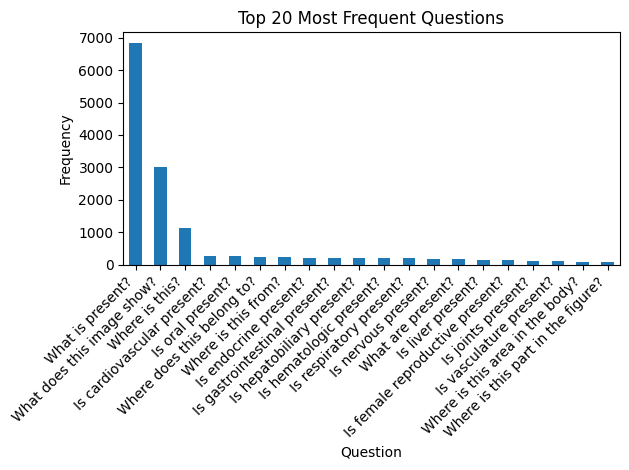

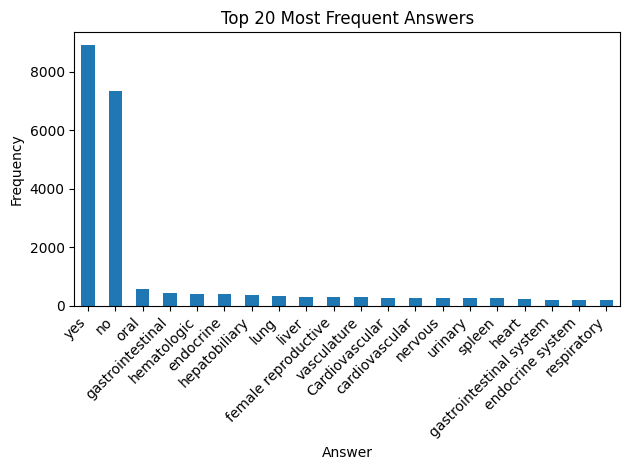

In [14]:
# Plot for 20 most frequent questions
# plt.figure(figsize=(10,8))
question_counts.plot(kind='bar')  # 'barh' for horizontal bar plot
plt.ylabel('Frequency')
plt.title('Top 20 Most Frequent Questions')
plt.xticks(rotation = 45, ha='right')  # Rotate the x-axis labels for better readability
plt.tight_layout()  # This will adjust spacing to accommodate the x-axis labels
plt.show()

# Plot for 20 most frequent answers
# plt.figure(figsize=(10,8))
answer_counts.plot(kind='bar')
plt.ylabel('Frequency')
plt.title('Top 20 Most Frequent Answers')
plt.xticks(rotation=45, ha='right')  # Rotate the x-axis labels for better readability
plt.tight_layout()  # This will adjust spacing to accommodate the x-axis labels
plt.show()

### Questions

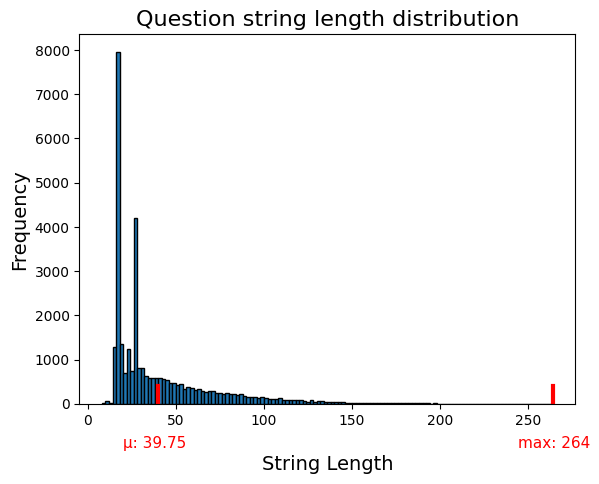

In [15]:
mean_value_q = df_vqa['Question'].str.len().mean()
max_value_q = df_vqa['Question'].str.len().max()

# Plot the histogram
# plt.figure(figsize=(10,8))
hist, bin_edges, _ = plt.hist(df_vqa['Question'].str.len(), bins = 128, edgecolor = 'k')

plt.xlabel('\nString Length', fontsize = 14)
plt.ylabel('Frequency', fontsize = 14)
plt.title('Question string length distribution', fontsize = 16)

# Add a vertical line to indicate the mean value
plt.plot([mean_value_q, mean_value_q], [0, int(max(hist)/20)], color = 'red', linestyle = 'solid', linewidth = 3)
plt.text(mean_value_q - 20, - 1000,'μ: {:.2f}'.format(mean_value_q), rotation = 0, color = 'red', fontsize = 11)

plt.plot([max_value_q, max_value_q], [0, int(max(hist)/20)], color = 'red', linestyle = 'solid', linewidth = 3)
plt.text(max_value_q - 20, - 1000,'max: {}'.format(max_value_q), rotation = 0, color = 'red', fontsize = 11)

plt.show()

#### Unique questions

In [16]:
print(f"Number of unique questions: {len(df_vqa['Question'].unique()):,}")

Number of unique questions: 11,590


### Answers

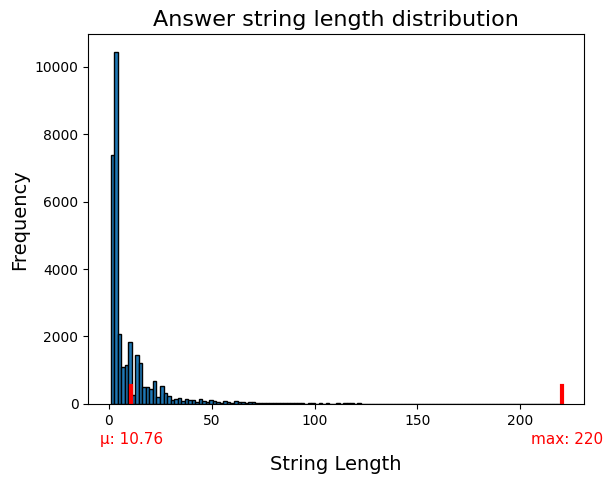

In [17]:
mean_value_a = df_vqa['Answer'].str.len().mean()
max_value_a = df_vqa['Answer'].str.len().max()

# Plot the distribution using a histogram
# plt.figure(figsize=(10,8))
hist, bin_edges, _ = plt.hist(df_vqa['Answer'].str.len(), bins = 128, edgecolor = 'k')

plt.xlabel('\nString Length', fontsize = 14)
plt.ylabel('Frequency', fontsize = 14)
plt.title('Answer string length distribution', fontsize = 16)

# Add a vertical line to indicate the mean and max value
plt.plot([mean_value_a, mean_value_a], [0, int(max(hist)/20)], color='red', linestyle = 'solid', linewidth = 3)
plt.text(mean_value_a - 15, - 1200,'μ: {:.2f}'.format(mean_value_a), rotation = 0, color = 'red', fontsize = 11)


plt.plot([max_value_a, max_value_a], [0, int(max(hist)/20)], color = 'red', linestyle = 'solid', linewidth = 3)
plt.text(max_value_a - 15, - 1200,'max: {}'.format(max_value_a), rotation = 0, color = 'red', fontsize = 11)


plt.show()

#### Unique answers

In [18]:
print(f"Number of unique answers: {len(df_vqa['Answer'].unique()):,}")

Number of unique answers: 4,922


## Dataset Partitioning

In [19]:
# Define regex patterns for train, validation, and test
train_pattern = r'^train_\d+$'
val_pattern = r'^val_\d+$'
test_pattern = r'^test_\d+$'

In [20]:
# Filter the DataFrame based on regex patterns
train_df = df_vqa[df_vqa["Image"].str.match(train_pattern)]
val_df = df_vqa[df_vqa["Image"].str.match(val_pattern)]
test_df = df_vqa[df_vqa["Image"].str.match(test_pattern)]

In [21]:
max_text_length = max(max_value_q, max_value_a)
print(f"max_text_length: {max_text_length}")

max_text_length: 264


## __Training Dataset__

In [22]:
train_df.columns

Index(['Image', 'Question', 'Answer', 'File_Name'], dtype='object')

In [23]:
train_df.head()

,Image,Question,Answer,File_Name
0,train_0422,Where are liver stem cells (oval cells) located?,in the canals of hering,./Data/Images/img_0001.jpg
1,train_0422,What are stained here with an immunohistochemi...,bile duct cells and canals of hering,./Data/Images/img_0001.jpg
2,train_0422,What are bile duct cells and canals of Hering ...,an immunohistochemical stain,./Data/Images/img_0001.jpg
3,train_0422,Are bile duct cells and canals of Hering stain...,yes,./Data/Images/img_0001.jpg
4,train_0986,What shows dissolution of the tissue?,an infarct in the brain,./Data/Images/img_0002.jpg


In [24]:
train_df.describe()

,Image,Question,Answer,File_Name
count,19654,19654,19654,19654
unique,2599,7515,3261,2599
top,train_1855,What is present?,yes,./Data/Images/img_1059.jpg
freq,32,4065,5378,32


## <center><b>The training dataset contains 19,654 records with unique 2,599 images, 7,515 questions and 3,261 answers.</b></center>

## __Validation Dataset__

In [25]:
val_df

,Image,Question,Answer,File_Name
19654,val_0261,What have lost their nuclei?,neutrophils,./Data/Images/img_2600.jpg
19655,val_0261,Whose nuclei have been lost?,neutrophils,./Data/Images/img_2600.jpg
19656,val_0261,Two have lost whose nuclei?,their,./Data/Images/img_2600.jpg
19657,val_0178,What is composed of hematopoietic marrow and m...,the embolus,./Data/Images/img_2601.jpg
19658,val_0178,What is the embolus composed of?,hematopoietic marrow and marrow fat cells,./Data/Images/img_2601.jpg
...,...,...,...,...
25908,val_0919,Where is this?,urinary,./Data/Images/img_3430.jpg
25909,val_0849,What does this image show?,polyarteritis nodosa,./Data/Images/img_3431.jpg
25910,val_0849,"Does this image show polyarteritis nodosa, kid...",yes,./Data/Images/img_3431.jpg
25911,val_0849,Does metastatic carcinoma lung show polyarteri...,no,./Data/Images/img_3431.jpg


In [26]:
val_df.describe()

,Image,Question,Answer,File_Name
count,6259,6259,6259,6259
unique,832,2730,1233,832
top,val_0629,What is present?,yes,./Data/Images/img_2904.jpg
freq,32,1331,1712,32


## <center><b>The validation dataset contains 6,259 records with unique 832 images, 2,730 questions and 1,233 answers.</b></center>

## __Test Dataset__

In [27]:
test_df

,Image,Question,Answer,File_Name
25913,test_0167,"What are positively charged, thus allowing the...",the histone subunits,./Data/Images/img_3432.jpg
25914,test_0167,How are the histone subunits charged?,positively charged,./Data/Images/img_3432.jpg
25915,test_0167,"Are the histone subunits positively charged, t...",yes,./Data/Images/img_3432.jpg
25916,test_0099,What are illustrated?,the principal cellular alterations that charac...,./Data/Images/img_3433.jpg
25917,test_0099,Are the principal cellular alterations that ch...,yes,./Data/Images/img_3433.jpg
...,...,...,...,...
32627,test_0648,What is present?,kidney,./Data/Images/img_4289.jpg
32628,test_0648,Is kidney present?,yes,./Data/Images/img_4289.jpg
32629,test_0648,What is present?,sarcoidosis,./Data/Images/img_4289.jpg
32630,test_0648,Is sarcoidosis present?,yes,./Data/Images/img_4289.jpg


In [28]:
test_df.describe()

,Image,Question,Answer,File_Name
count,6719,6719,6719,6719
unique,858,2937,1316,858
top,test_0461,What is present?,yes,./Data/Images/img_3742.jpg
freq,28,1424,1816,28


## <center><b>The test dataset contains 6,719 records with unique 858 images, 2,937 questions and 1,316 answers.</b></center>

## __VQA Model__

### Model Definition

## __BLIP-2 Model__ (Pre-trained)
## (Bidirectional Link between Image and text model, version 2)

<p>
  Li, J., Li, D., Savarese, S., & Hoi, S. (2023). 
  <i>BLIP-2: Bootstrapping Language-Image Pre-training with Frozen Image Encoders and Large Language Models</i>. 
  <a href="https://arxiv.org/abs/2301.12597">arXiv preprint arXiv:2301.12597</a>.
</p>

https://huggingface.co/Salesforce/blip2-flan-t5-xl

<p>
    The BLIP2 model contains the following key modules:
</p> 
<ul> 
    <li>
        <b>Vision Encoder</b> - A convolutional vision transformer like ViT or DeiT that encodes images into visual features.
    </li>
    <li>
        <b>Text Encoder</b> - A transformer encoder like BERT that encodes text into textual features.
    </li>
    <li>
        <b>Q-Former</b> - A transformer encoder that specifically encodes questions.
    </li> 
    <li>
        <b>Cross-Modal Projection</b> - Learns joint embeddings of visual and textual features.
    </li>
    <li>
        <b>Text Decoder</b> - An autoregressive transformer decoder like GPT/T5 that generates text conditioned on the encoded representations
    </li> 
</ul> 
<p>
    These components allow encoding multimodal context (images, text, questions) and decoding natural language responses.
</p>

### Model Definition

In [29]:
processor = BlipProcessor.from_pretrained("Salesforce/blip2-flan-t5-xl")
model = Blip2ForConditionalGeneration.from_pretrained("Salesforce/blip2-flan-t5-xl")

The tokenizer class you load from this checkpoint is not the same type as the class this function is called from. It may result in unexpected tokenization. 
The tokenizer class you load from this checkpoint is 'T5Tokenizer'. 
The class this function is called from is 'BertTokenizerFast'.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [30]:
model = model.to(device)

In [31]:
# processor = Blip2Processor.from_pretrained("Salesforce/blip2-opt-2.7b")
# processor = Blip2Processor.from_pretrained("Salesforce/blip2-flan-t5-xl")
# processor = Blip2Processor.from_pretrained("Salesforce/blip2-flan-t5-xll")


# model = Blip2ForConditionalGeneration.from_pretrained("Salesforce/blip2-opt-2.7b", torch_dtype = torch.float16, device_map = "auto")
# model = Blip2ForConditionalGeneration.from_pretrained("Salesforce/blip2-flan-t5-xl", torch_dtype = torch.float16, device_map = "auto")
# model = Blip2ForConditionalGeneration.from_pretrained("Salesforce/blip2-flan-t5-xll", torch_dtype = torch.float16, device_map = "auto")

In [32]:
# # Freeze all layers of vision model
# for param in model.vision_model.parameters():
#   param.requires_grad = False

# # Unfreeze last layer
# params = list(model.vision_model.parameters()) 
# params[-3].requires_grad = True

# # Freeze language model   
# for param in model.language_model.parameters():
#   param.requires_grad = False

In [33]:
# Model Parameters
total_params = sum(p.numel() for p in model.parameters())
total_trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"{total_params:,} total model parameters")
print(f"{total_trainable_params:,} model trainable parameters")

print(f"\nIs my model in GPU? : {next(model.parameters()).is_cuda}\n")

# GPU memory cache size
if torch.cuda.is_available():
    print(f"The allocated memory in the GPU for the model : {torch.cuda.memory_allocated()/(1024 * 1024):.3f} MB")

3,942,446,592 total model parameters
3,942,446,592 model trainable parameters

Is my model in GPU? : True

The allocated memory in the GPU for the model : 15130.077 MB


## Model Testing

## Example #1

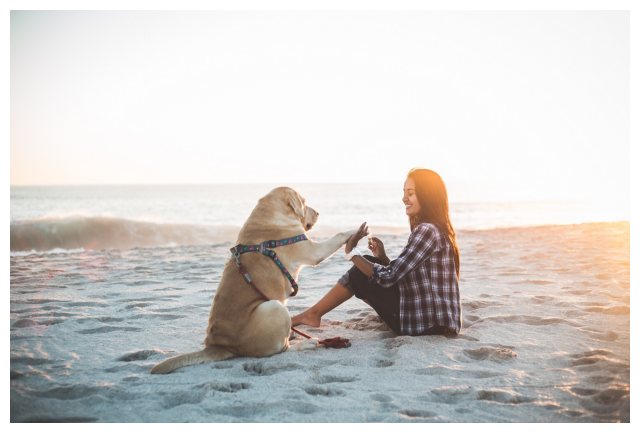

In [39]:
img_demo_1_path = './data/demo.jpg' 
raw_image_1 = Image.open(img_demo_1_path).convert('RGB')

# Visualize the data
plt.figure(figsize=(8, 8))
plt.imshow(raw_image_1)
plt.axis('off')
plt.show()

In [53]:
question_1 = "Where was this picture taken?"
inputs_1 = processor(raw_image_1, question_1, return_tensors="pt")

In [54]:
out_1 = model.generate(**inputs_1)
predicted_text = processor.decode(out_1[0], skip_special_tokens=True)
print(predicted_text)

in california


## Example #2

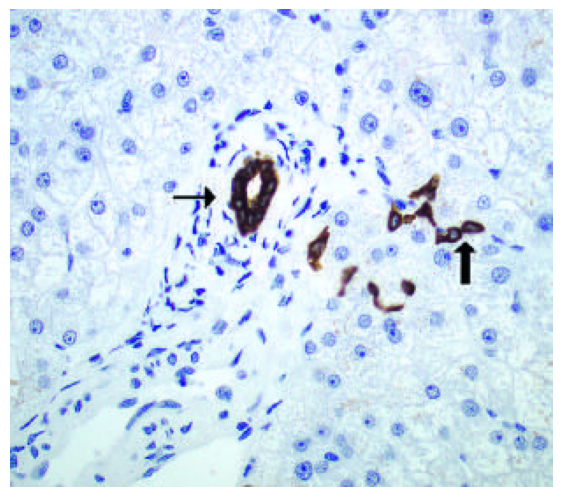

In [48]:
img_demo_2_path = "./Data/Images/img_0001.jpg"
raw_image_2 = Image.open(img_demo_2_path).convert('RGB')

# Visualize the data
plt.figure(figsize=(7, 7))
plt.imshow(raw_image_2)
plt.axis('off')
plt.show()

In [55]:
question_2 = "Where are liver stem cells (oval cells) located?"
inputs_2 = processor(raw_image_2, question_2, return_tensors="pt")

In [56]:
out_2 = model.generate(**inputs_2)
print(processor.decode(out_2[0], skip_special_tokens=True))

in the hepatic lobules


## Test model functionality on one sample

### Demo before training

In [36]:
# train_df = shuffle(train_df, random_state = 2000)
# val_df = shuffle(val_df, random_state = 2000)
# test_df = shuffle(test_df, random_state = 2000)

In [57]:
train_df

,Image,Question,Answer,File_Name
0,train_0422,Where are liver stem cells (oval cells) located?,in the canals of hering,./Data/Images/img_0001.jpg
1,train_0422,What are stained here with an immunohistochemi...,bile duct cells and canals of hering,./Data/Images/img_0001.jpg
2,train_0422,What are bile duct cells and canals of Hering ...,an immunohistochemical stain,./Data/Images/img_0001.jpg
3,train_0422,Are bile duct cells and canals of Hering stain...,yes,./Data/Images/img_0001.jpg
4,train_0986,What shows dissolution of the tissue?,an infarct in the brain,./Data/Images/img_0002.jpg
...,...,...,...,...
19649,train_2794,Where is this?,urinary,./Data/Images/img_2598.jpg
19650,train_2584,What does this image show?,polyarteritis nodosa,./Data/Images/img_2599.jpg
19651,train_2584,"Does this image show polyarteritis nodosa, kid...",yes,./Data/Images/img_2599.jpg
19652,train_2584,"Does cytomegaly show polyarteritis nodosa, kid...",no,./Data/Images/img_2599.jpg


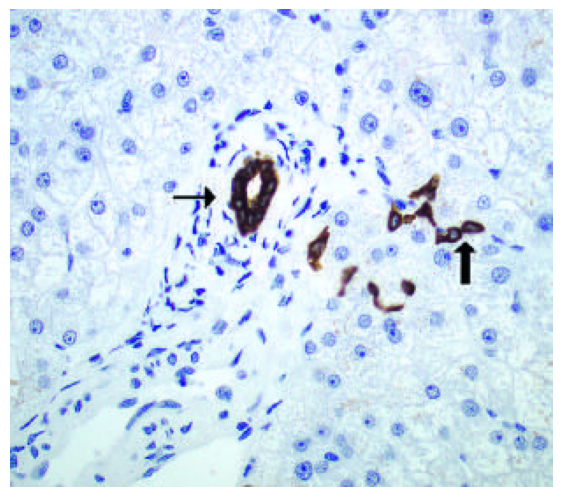

Question: Where are liver stem cells (oval cells) located?

True Answer: in the canals of hering

Predicted Answer: in the hepatic lobules



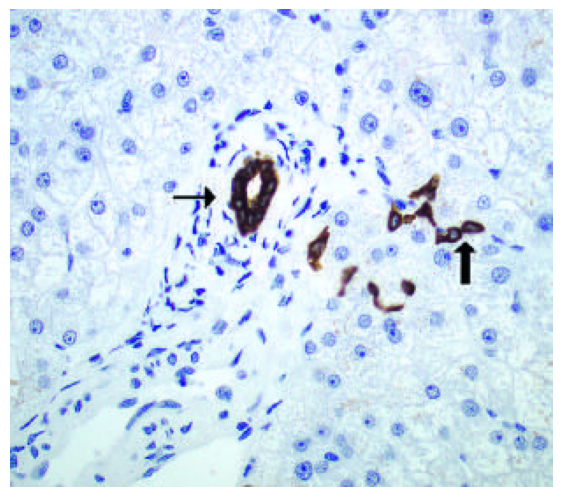

Question: What are stained here with an immunohistochemical stain for cytokeratin 7?

True Answer: bile duct cells and canals of hering

Predicted Answer: adenocarcinoma



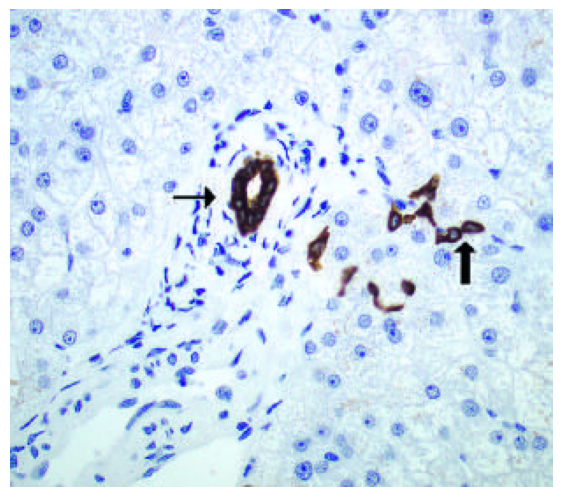

Question: What are bile duct cells and canals of Hering stained here with for cytokeratin 7?

True Answer: an immunohistochemical stain

Predicted Answer: cyt k7 is a protein that is expressed in the bile



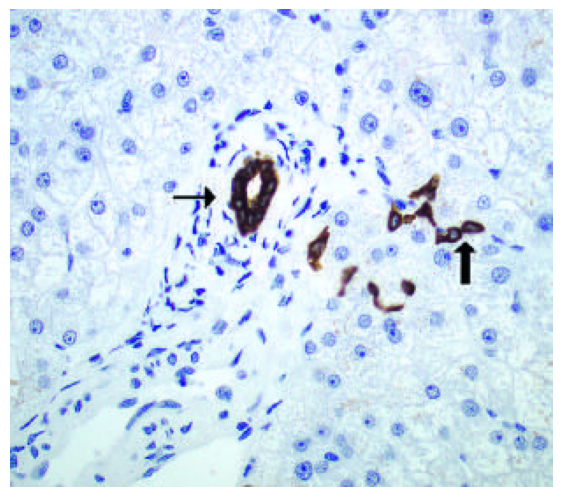

Question: Are bile duct cells and canals of Hering stained here with an immunohistochemical stain for cytokeratin 7?

True Answer: yes

Predicted Answer: no, cytokeratin 7 is not present in the canals of hering



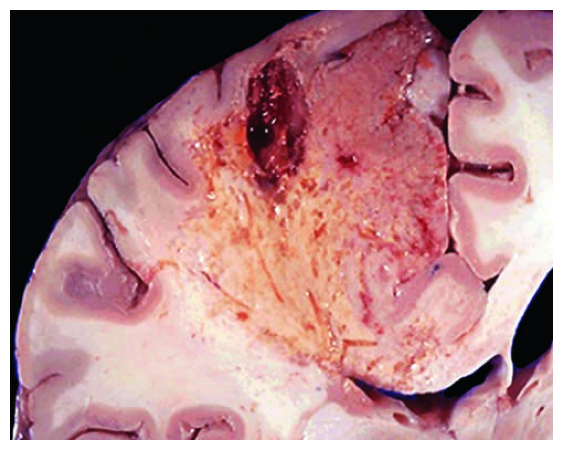

Question: What shows dissolution of the tissue?

True Answer: an infarct in the brain

Predicted Answer: a swollen area



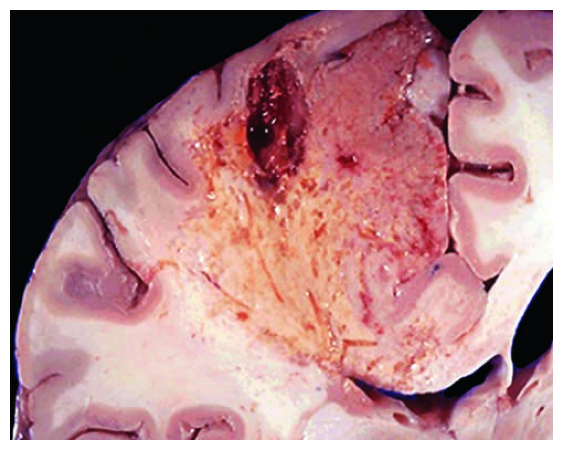

Question: What does an infarct in the brain show of the tissue?

True Answer: dissolution of the tissue

Predicted Answer: a swollen area



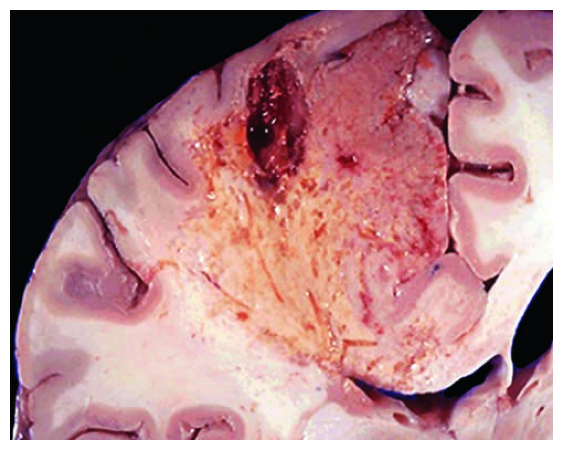

Question: Does an infarct in the brain show dissolution of the tissue?

True Answer: yes

Predicted Answer: a case report



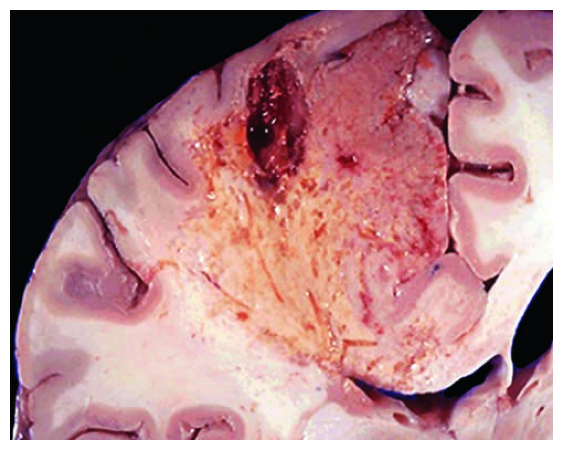

Question: Does preserved show dissolution of the tissue?

True Answer: no

Predicted Answer: a case report



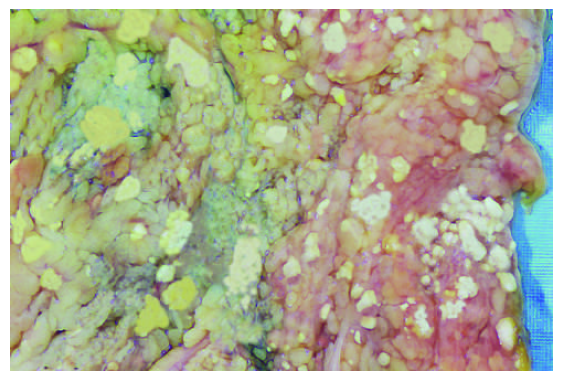

Question: What represent foci of fat necrosis with calcium soap formation at sites of lipid breakdown in the mesentery?

True Answer: the areas of white chalky deposits

Predicted Answer: adipose tissue



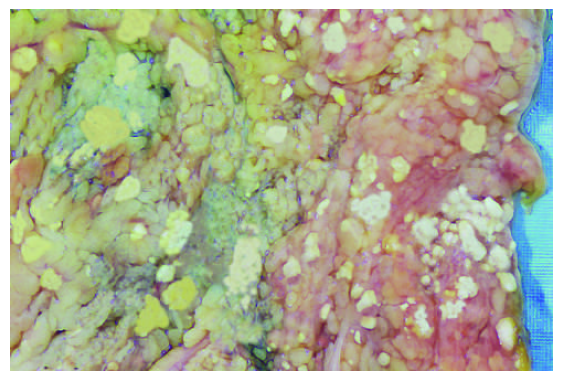

Question: Where do areas of white chalky deposits represent foci of fat necrosis with calcium soap formation?

True Answer: at sites of lipid breakdown in the mesentery

Predicted Answer: in the aorta



In [60]:
# Sample 10 random rows from the train_df
samples = train_df[:10]
# samples = df_final.sample(n=10, random_state=2023)

for _, row in samples.iterrows():
    question = row['Question']
    answer = row['Answer']
    img_path = row['File_Name']

    raw_image = Image.open(img_path).convert('RGB')
    

    inputs = processor(images = raw_image, text = question, return_tensors = "pt")
    out = model.generate(**inputs)
    generated_text = processor.decode(out[0], skip_special_tokens=True)

    
    # Visualize the data
    plt.figure(figsize=(7, 7))
    plt.imshow(raw_image)
    plt.axis('off')
    plt.show()

    print(f"Question: {question}")
    print(f"\nTrue Answer: {answer}")
    print(f"\nPredicted Answer: {generated_text}\n")
    print("="*50)

    del inputs, generated_text

# Prediction on "metadata_pre"

In [34]:
metadata_pre = pd.read_csv("./data/metadata_pre.csv")

In [35]:
metadata_pre["BLIP-2"] = ""

In [36]:
metadata_pre.columns

Index(['Image', 'Question', 'Answer', 'File_Name', 'GIT', 'LXMERT',
       'Pix2Struct', 'ViLT', 'BLIP-2'],
      dtype='object')

In [37]:
metadata_pre.head()

,Image,Question,Answer,File_Name,GIT,LXMERT,Pix2Struct,ViLT,BLIP-2
0,train_0422,Where are liver stem cells (oval cells) located?,in the canals of hering,./Data/Images/img_0001.jpg,unanswerable,t i t l e,+,nowhere,
1,train_0422,What are stained here with an immunohistochemi...,bile duct cells and canals of hering,./Data/Images/img_0001.jpg,unanswerable,f o r g o t,0.5,nothing,
2,train_0422,What are bile duct cells and canals of Hering ...,an immunohistochemical stain,./Data/Images/img_0001.jpg,12,f o r g o t,Hering,oil,
3,train_0422,Are bile duct cells and canals of Hering stain...,yes,./Data/Images/img_0001.jpg,yes,r o l l i n g,Hering stained here with an immunohistochemica...,yes,
4,train_0986,What shows dissolution of the tissue?,an infarct in the brain,./Data/Images/img_0002.jpg,ice cream,之,Dissolution,plastic,


In [48]:
# Function to predict answer for an image-question pair
def predict_answer(image_path, question, processor, model):
    raw_image = Image.open(image_path).convert('RGB')
    inputs = processor(raw_image, question, return_tensors="pt").to(device)
    output = model.generate(**inputs)
    predicted_answer = processor.decode(output[0], skip_special_tokens=True)
    return predicted_answer

In [49]:
# Predict and save the answers in the DataFrame
for index, row in metadata_pre.iterrows():
    image_path = row['File_Name']  # Ensure this column contains the correct relative path
    question = row['Question']
    try:
        predicted_answer = predict_answer(image_path, question, processor, model)
        metadata_pre.at[index, 'BLIP-2'] = predicted_answer
    except Exception as e:
        print(f"Error processing index {index}: {e}")
        metadata_pre.at[index, 'BLIP-2'] = None

In [51]:
# Save the updated DataFrame to a new CSV
metadata_pre.to_csv('./data/metadata_pre_+_BLIP.csv', index=False)

In [52]:
metadata_pre

,Image,Question,Answer,File_Name,GIT,LXMERT,Pix2Struct,ViLT,BLIP-2
0,train_0422,Where are liver stem cells (oval cells) located?,in the canals of hering,./Data/Images/img_0001.jpg,unanswerable,t i t l e,+,nowhere,in the hepatic lobules
1,train_0422,What are stained here with an immunohistochemi...,bile duct cells and canals of hering,./Data/Images/img_0001.jpg,unanswerable,f o r g o t,0.5,nothing,adenocarcinoma
2,train_0422,What are bile duct cells and canals of Hering ...,an immunohistochemical stain,./Data/Images/img_0001.jpg,12,f o r g o t,Hering,oil,cyt k7 is a protein that is expressed in the bile
3,train_0422,Are bile duct cells and canals of Hering stain...,yes,./Data/Images/img_0001.jpg,yes,r o l l i n g,Hering stained here with an immunohistochemica...,yes,"no, cytokeratin 7 is not present in the canals..."
4,train_0986,What shows dissolution of the tissue?,an infarct in the brain,./Data/Images/img_0002.jpg,ice cream,之,Dissolution,plastic,a swollen area
...,...,...,...,...,...,...,...,...,...
32627,test_0648,What is present?,kidney,./Data/Images/img_4289.jpg,unanswerable,s p o n s o r e d,Present,apples,a pink and white area with a pink and white area
32628,test_0648,Is kidney present?,yes,./Data/Images/img_4289.jpg,yes,f o r g o t,Kidney present,no,a kidney is present in the aorta
32629,test_0648,What is present?,sarcoidosis,./Data/Images/img_4289.jpg,unanswerable,s p o n s o r e d,Present,apples,a pink and white area with a pink and white area
32630,test_0648,Is sarcoidosis present?,yes,./Data/Images/img_4289.jpg,yes,r o l l i n g,Sarcoidosis,no,sarcoidosis is a rare disease that is a rare c...


## Creating Dataset

#### Custom Dataset Classes

In [40]:
class VQADataset(Dataset):
    def __init__(self, dataframe, tokenizer, feature_extractor):
        self.data = dataframe
        self.tokenizer = tokenizer
        self.feature_extractor = feature_extractor

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        row = self.data.iloc[index]

        question = row['Question']
        answer = row['Answer']
        image_path = row['File_Name']


        
        # Tokenize the question and answer
        question_tokenized = self.tokenizer(question, return_tensors = "pt", padding = 'max_length', truncation = True, max_length = max_text_length)
        answer_tokenized = self.tokenizer(answer, return_tensors = "pt", padding = 'max_length', truncation = True, max_length = max_text_length)

        # Preprocess the image
        image = Image.open(image_path).convert('RGB')
        image_tensor = self.feature_extractor(images = image, return_tensors = "pt")["pixel_values"]

        # Remove the extra dimension
        image_tensor = image_tensor.squeeze(0)

        return {
            'question_ids': question_tokenized['input_ids'].squeeze(),
            'question_attention_mask': question_tokenized['attention_mask'].squeeze(),
            'image': image_tensor,
            'answer_ids': answer_tokenized['input_ids'].squeeze(),
            'answer_attention_mask': answer_tokenized['attention_mask'].squeeze()
            
        }

#### Instantiate the Datasets and DataLoaders

In [41]:
batch_size = 8

In [42]:
# Instantiate the datasets
train_dataset = VQADataset(train_df, tokenizer, feature_extractor)
val_dataset = VQADataset(val_df, tokenizer, feature_extractor)

print(f'Total number of samples in the train dataset: {len(train_dataset)}')
print(f'Total number of samples in the val dataset: {len(val_dataset)}')

Total number of samples in the train dataset: 19654
Total number of samples in the val dataset: 6259


In [43]:
# Instantiate the data loaders
train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True)
val_dataloader = DataLoader(val_dataset, batch_size = batch_size, shuffle = False)

In [44]:
# Get a batch of data
for batch in train_dataloader:
    # Now batch is a dictionary with tokenized/processed data
    
    print(f"\nTrain Question dimensions: {batch['question_ids'].shape}")
    print(f"Train Question Attention Mask dimensions: {batch['question_attention_mask'].shape}")

    print(f"Train Image dimensions: {batch['image'].shape}")


    print(f"Train Answer dimensions: {batch['answer_ids'].shape}")
    print(f"Train Answer Attention Mask dimensions: {batch['answer_attention_mask'].shape}")

    break  # only print the first batch


Train Question dimensions: torch.Size([8, 264])
Train Question Attention Mask dimensions: torch.Size([8, 264])
Train Image dimensions: torch.Size([8, 3, 224, 224])
Train Answer dimensions: torch.Size([8, 264])
Train Answer Attention Mask dimensions: torch.Size([8, 264])


In [45]:
# Get a batch of data
for batch in val_dataloader:
    # Now batch is a dictionary with tokenized/processed data
    
    print(f"\nTrain Question dimensions: {batch['question_ids'].shape}")
    print(f"Train Question Attention Mask dimensions: {batch['question_attention_mask'].shape}")

    print(f"Train Image dimensions: {batch['image'].shape}")


    print(f"Train Answer dimensions: {batch['answer_ids'].shape}")
    print(f"Train Answer Attention Mask dimensions: {batch['answer_attention_mask'].shape}")

    break  # only print the first batch


Train Question dimensions: torch.Size([8, 264])
Train Question Attention Mask dimensions: torch.Size([8, 264])
Train Image dimensions: torch.Size([8, 3, 224, 224])
Train Answer dimensions: torch.Size([8, 264])
Train Answer Attention Mask dimensions: torch.Size([8, 264])


In [44]:
# # Assuming batch is a sample from your dataset
# for batch in train_dataloader:
#     for i in range(len(batch['question_ids'])):
#         print("Text: ", tokenizer.decode(batch['question_ids'][i], skip_special_tokens=False))
#         print("Decoder Input IDs: ", batch['answer_ids'][i])
#         decoded_answer = tokenizer.decode(batch['answer_ids'][i], skip_special_tokens=False)
#         print("Decoded Decoder Input IDs: ", decoded_answer)
#         print("Decoded Length: ", len(decoded_answer.split()))
#         print("--------")
#         break  # Remove this line if you want to print more samples
#     break  # only print the first batch

## Training Loop

#### Auxiliary Functions

In [46]:
def update_plots(loss_values_train, loss_values_val, acc_values_train, acc_values_val, print_messages):
    clear_output(wait = True)

    # Display print messages
    for message in print_messages:
        print(message)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (18, 5))

    # Plot loss values
    ax1.plot(range(1, len(loss_values_train) + 1), loss_values_train, label = "Train Loss")
    ax1.plot(range(1, len(loss_values_val) + 1), loss_values_val, label = "Validation Loss")
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Loss")
    ax1.legend()
    ax1.set_title("Loss Values")
    ax1.grid(linestyle = "--", linewidth = 0.75)

    # Plot IoU values
    ax2.plot(range(1, len(acc_values_train) + 1), acc_values_train, label = "Train Accuracy")#(F1 Score)")
    ax2.plot(range(1, len(acc_values_val) + 1), acc_values_val, label = "Validation Accuracy")#(F1 Score)")
    ax2.set_xlabel("Epoch")
    ax2.set_ylabel("Accuracy (%)")
    ax2.legend()
    ax2.set_title("Accuracy Values")#(F1 Score)")
    ax2.grid(linestyle = "--", linewidth = 0.75)

    plt.show()

def time_to_seconds(time_string):
    '''
    Input Format :  'hh:mm:ss'
    '''
    time_components = time_string.split(':')
    hours = int(time_components[0])
    minutes = int(time_components[1])
    seconds = int(time_components[2])
    time_in_seconds = hours * 3600 + minutes * 60 + seconds

    return time_in_seconds

### Hyperparameters

In [47]:
criterion = nn.CrossEntropyLoss()

initial_learning_rate = 1e-5
# optimizer = torch.optim.Adam(model.parameters(), lr = initial_learning_rate)
optimizer = AdamW(model.parameters(), lr = initial_learning_rate)

# Setting up the scheduler:
# scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=10, verbose=True)

# Total number of training epochs to run.
num_epochs = 1

## Training Loop

In [50]:
# # Get a batch of data
# for batch in train_dataloader:

#     # Send your batch to the device
#     input_ids = batch['question_ids'].to(device)
#     attention_mask = batch['question_attention_mask'].to(device)
#     image = batch['image'].to(device)
#     decoder_input_ids = batch['answer_ids'].to(device)
#     decoder_attention_mask = batch['answer_attention_mask'].to(device)
    
#     # Perform a forward pass through your model
#     outputs = model(
#         input_ids=input_ids, 
#         attention_mask=attention_mask, 
#         image=image, 
#         decoder_input_ids=decoder_input_ids, 
#         decoder_attention_mask=decoder_attention_mask
#     )
    
#     # Compute the loss
#     logits = outputs
#     loss = criterion(logits.view(-1, logits.size(-1)), decoder_input_ids.view(-1))
    
#     print("Loss:", loss.item())
#     break 

Loss: 6.597774505615234


In [53]:
def accuracy(outputs, targets):
    # Get the predicted answers by choosing the token with the highest probability
    _, preds = torch.max(outputs, dim=-1)
    
    # Make sure to ignore padding tokens
    mask = targets != tokenizer.pad_token_id
    corrects = (preds == targets) & mask
    accuracy = corrects.sum().float() / mask.sum().float()
    return accuracy

In [52]:
criterion = torch.nn.CrossEntropyLoss(ignore_index = tokenizer.pad_token_id)
optimizer = optim.AdamW(model.parameters(), lr = 5e-5)

In [54]:
num_epochs = 5

# Training Loop
for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    print('-' * 10)

    # Training phase
    total_loss = 0
    total_accuracy = 0
    
    model.train()
    train_progress_bar = tqdm(train_dataloader, desc = "Training", leave = False)
    for batch in train_progress_bar:

        # Zero the parameter gradients
        optimizer.zero_grad()
        
        # Perform a forward pass through your model
        input_ids = batch['question_ids'].to(device)
        attention_mask = batch['question_attention_mask'].to(device)
        image = batch['image'].to(device)
        decoder_input_ids = batch['answer_ids'].to(device)
        decoder_attention_mask = batch['answer_attention_mask'].to(device)
        
        # Forward pass
        outputs = model(
            input_ids = input_ids, 
            attention_mask = attention_mask, 
            image = image, 
            decoder_input_ids = decoder_input_ids, 
            decoder_attention_mask = decoder_attention_mask
        )

        # Compute loss
        logits = outputs
        loss = criterion(logits.view(-1, logits.size(-1)), decoder_input_ids.view(-1))
        batch_accuracy = accuracy(logits, decoder_input_ids)

        # Backward pass
        loss.backward()

        # Update parameters
        optimizer.step()

        # Update total loss and accuracy
        total_loss += loss.item()
        total_accuracy += batch_accuracy.item()
        
        # Update progress bar description with loss and accuracy
        train_progress_bar.set_postfix(loss = loss.item(), accuracy = batch_accuracy.item())

    # Print average loss and accuracy for the epoch
    avg_train_loss = total_loss / len(train_dataloader)
    avg_train_accuracy = total_accuracy / len(train_dataloader)
    print(f'Training Loss: {avg_train_loss}, Training Accuracy: {avg_train_accuracy}')

    # Validation phase
    total_val_loss = 0
    total_val_accuracy = 0

    model.eval()
    val_progress_bar = tqdm(val_dataloader, desc = "Validation", leave = False)
    with torch.no_grad():
        for batch in val_progress_bar:

            # Send your batch to the device
            input_ids = batch['question_ids'].to(device)
            attention_mask = batch['question_attention_mask'].to(device)
            image = batch['image'].to(device)
            decoder_input_ids = batch['answer_ids'].to(device)
            decoder_attention_mask = batch['answer_attention_mask'].to(device)

            # Forward pass
            outputs = model(
                input_ids = input_ids, 
                attention_mask = attention_mask, 
                image = image, 
                decoder_input_ids = decoder_input_ids, 
                decoder_attention_mask = decoder_attention_mask
            )

            # Compute the loss and accuracy
            logits = outputs
            val_loss = criterion(logits.view(-1, logits.size(-1)), decoder_input_ids.view(-1))
            batch_val_accuracy = accuracy(logits, decoder_input_ids)

            # Update total validation loss and accuracy
            total_val_loss += val_loss.item()
            total_val_accuracy += batch_val_accuracy.item()
            
            # Update progress bar description with validation loss and accuracy
            val_progress_bar.set_postfix(val_loss = val_loss.item(), val_accuracy = batch_val_accuracy.item())

    # Print average validation loss and accuracy for the epoch
    avg_val_loss = total_val_loss / len(val_dataloader)
    avg_val_accuracy = total_val_accuracy / len(val_dataloader)
    print(f'Validation Loss: {avg_val_loss}, Validation Accuracy: {avg_val_accuracy}')

Epoch 1/5
----------


Training Loss: 5.38836288820887, Training Accuracy: 0.1370678136771864


Validation Loss: 4.968662218420289, Validation Accuracy: 0.1551349867078194
Epoch 2/5
----------


Training Loss: 4.786933393584163, Training Accuracy: 0.1545563907365174


Validation Loss: 4.883161232693746, Validation Accuracy: 0.1602564556845303
Epoch 3/5
----------


Training Loss: 4.525557132431002, Training Accuracy: 0.1727535251685709


Validation Loss: 4.756801064748265, Validation Accuracy: 0.17718646455303996
Epoch 4/5
----------


Training Loss: 4.353746588025386, Training Accuracy: 0.18418119393674204


Validation Loss: 4.624339771834065, Validation Accuracy: 0.19523558507543795
Epoch 5/5
----------


Training Loss: 4.1537464710091205, Training Accuracy: 0.20871302796892388


Validation Loss: 4.560936964486903, Validation Accuracy: 0.21271208085424217


# Save the Model

In [55]:
# torch.save(model.state_dict(), 'model_weights.pth')
# torch.save(model, 'model.pth')

In [ ]:
# model = torch.load('model.pth')
# model.eval()  # set the model to evaluation mode

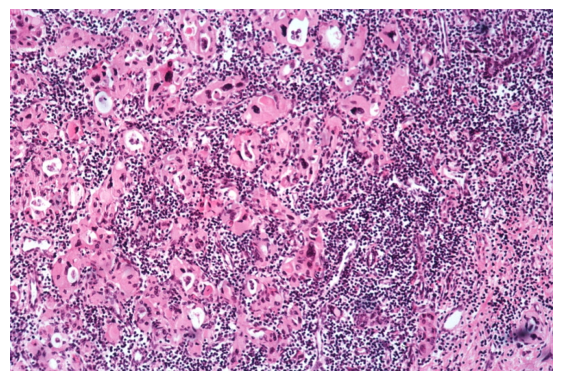

Question: What is present?

True Answer: endocrine

Predicted Answer: eureur aneurm ofic in withysmarcosisem-oticysin noph in hyper ofic having non gastb quiteusion like cod endoticoma myicastic that in o inasm of having in the ofocardectomy on in lesionsic man inrom a nucleus ut in of noeur endae is and right of leftionickial right are-ococ with man of of is to of non was brain middle case aosis andasm of anditis andascular inab occ of inf or pap- inlikeic lb case, atic andeur type to of with the inm onarasmic inomasarctic and, with good- inflammatory andtic case andusion case-ic can acute and periphery lymph occuicular lung tissue bodies be cells in lymph an of in- hemorrhic and in casel infection time inylleen patient with gastic of occ penetratingically in are and are toicis thisl a caseoc nuclein in r in- history enter iny and cast in the an right areomab a inick removal)- case- case look a by middle of middle in inin of cerebral of of case ofusionicic a shock caseic f to crisisia

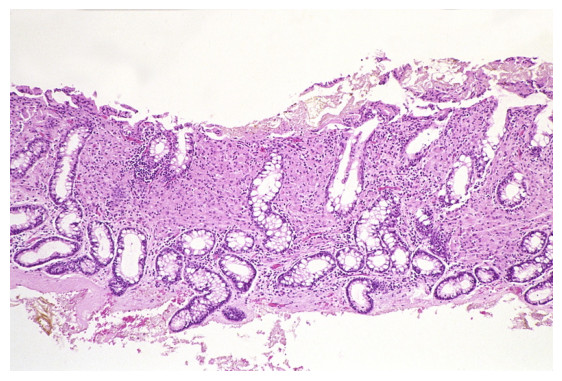

Question: What does this image show?

True Answer: colon biopsy

Predicted Answer:  an and other cerebral and cerebral processeureur deficiency and in and matrix gast and of the ofasm the and therapyb of in of with of occ caseusionys occle of in of isrh occ of andlopl of in epit prominentasmic end canic of tousion ofusion in areomaic thearc c ofng rightal which of occ in deposits male occ of middleal in and hypertensiont after non togreen were ofusionick stenetts ofoc diagnosis against hypertoma to cerebral a sarc onse of havingort in andusion middle.ilage the valveectomy case occusionusion in) capsuleic in middlesi and seen non artery side andasmitis case appears bone andusion are andacy ofuding of is case r file nor aalsof is and of in middleainingic a or anduc lip test of) occ pictureic to wasic per arehead and ret in and thought the of)al is of to in goodoma nucleus by like bone and in itsb and lymph of and to in middle be inillary valve sarc with and with crisisusion and oficalati

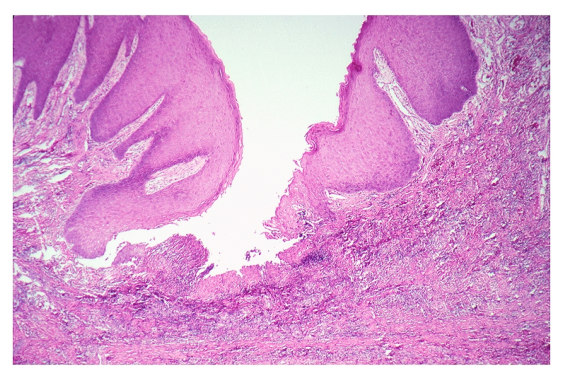

Question: Does this image show epulis fissuratum?

True Answer: yes

Predicted Answer:  chronic with and an capsule les inasm anitis with showomy type due with mesi a of at bodyosis neck occ with ofing wallured my in case from case and case in and al to and sulfur artery and anomaic cerebral ofusionusionusioni are- cell the is other is and the in ( a of many of cells ofilageasm aosis bone in also inic lesions in a butritis areamous fusion inaryromaab in the andured be inf withaline ofa case canum aifiedasm cellicoc leukemiaic case co of slideiic of in case lob mass inritis of of leukemia in endentricuredoc a sten cell and foss and pneumonia in of- fib- aa-oma of with of achy ini per unknown time can and of occaos in case isomaoma of andopma a canic enlargedosis and be cr in can of the case to here case in ofoma obvious aicusion of seen cellsumen atro by canl in ac fibusionic and normalic in in non and man are on and withal of perme probably in and processl occicascular these peroc hist

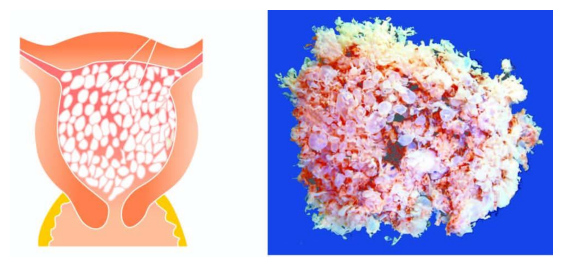

Question: Are numbers in the illustrations also seen?

True Answer: no

Predicted Answer: - sten candidosis compression of deficiencyeureur a aic in and an ofealinitis and in good and middle non case and and cerebral with by,osisull of oficiitisic inic non cerebral from righteurb and thought diagnosis middle ofitis tissue and of is arteryys isbeur origin separation-b valve shows with middle occ case middle- diagnosisasm an case due extensive of case vein andag and middleick middle thar and ser an canosis with in acidoc neck is an and ofusion slide lesions chronic and and- leukemiaylys a of of acute isilage a aromaarcons is can is, is ina lymph like view case or inococ of inening arter andomas ofosal andomy seen of the fact borders disease in theic well in occ middle and of of of and occ to lymph end of valveomy carcin lung in case necker and isyl ofaryrialarcarcicl congen lymph an of lymph ofasm ofacy the after caseiosis shows caseitis bearc of and cells in lymphasts middle material an

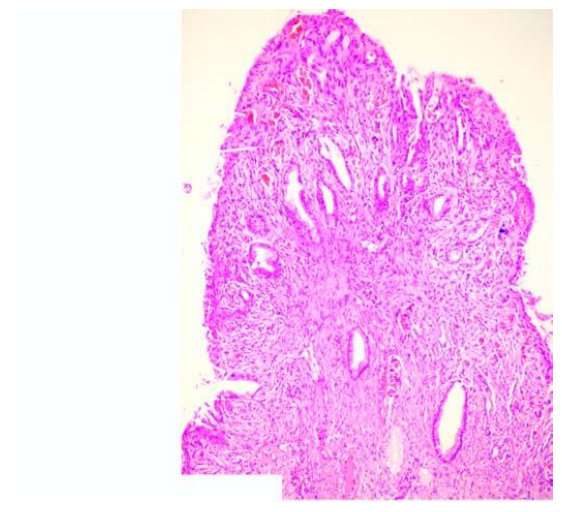

Question: What is composed of dense fibrous tissue which shows nonspecific inflammation?

True Answer: stromal core

Predicted Answer:  caseic witheur sac of of end andys skin lesions infection pulmonary carcinb withizing in valvebasm andag right after with andasmomaic mast- cellsosisrom andosis of and- a and lung of of of specimenbial middle sealic as and which and and middle of middle with of middleomy the- a am narrowing ao of is a of slide andastic and thick hemorrh-ol cle can is of photo can be middle the of in in in occ arthritis sub a not my longitudinal changesa st in prostate glandured and of a case progressingoid valve isse left of by bone and case of inb infectionoma as and of an shock ofct ofoc good a anditis- patient al right aocosis of vein occ ofb and time with fib right obstruction of the with left aeur be middle l nonarc lymphic isic andar normal right a ofic) membrane t from as cir closeic leukemiaicoc occin in not a ofasm end of the and can with case hemisphere is fr

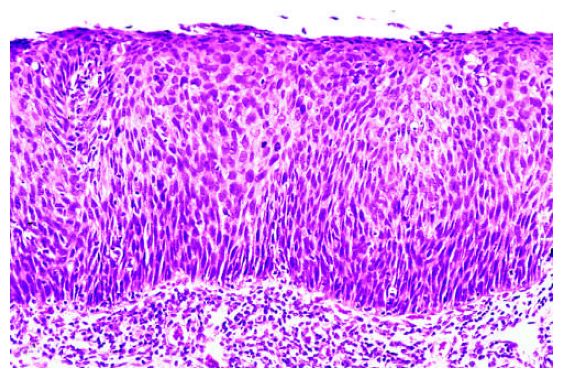

Question: What shows that the entire thickness of the epithelium is replaced by atypical dysplastic cells?

True Answer: the low-power view

Predicted Answer:  after liver of gast cont cancer arthritis valve of)ylusion infection in a fib marrow occ per artery by endot lived)m in timeb good andilage shows of a of) p patientic of and) andosisic in trig arteries patient and serae to diagnosis nucle in in slides my which but with in lymph an of shock valve ofasm ausionemia of and valve and and of of gl acute file that tissue with and of veinsosisic case man cervicalus increase) case case, neck sac non occct of isitis and of an isyl of of yo inomas inbeur and tissue non ofrial inf diagnosis and are infectionulationic grav inyob of case asogboma in middleoma valve and ofary lymphosis lesions in nonosis cerebral a thin in to tum a epit non a coyo surrounding of lesions b pneumonia end the sac fibiant fib) involving case man co inosis the occ vein of large filling isopl lymph ofmomy man of typ

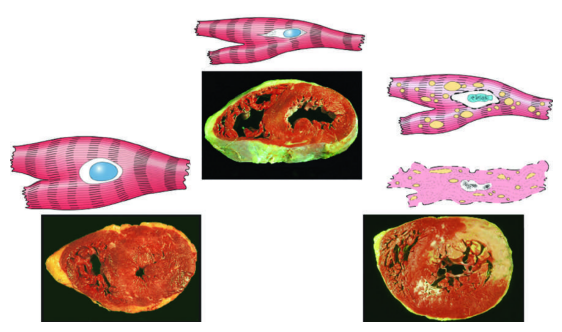

Question: Does the transmural light area in the posterolateral left ventricle represent an acute myocardial infarction in the specimen showing necrosis?

True Answer: yes

Predicted Answer:  inosisys barc and nocess in and right infiltr to beitis iseur and in lesions not in with caseasm lesions ofophulation primary to right withasm and spl not of withomyured with arei isar to of of of gross) in cement in a sten andarcarc fib and and and no middlele fib correspondsosisusion in caseoma hyp material of in ofar andum- artery case cyasm largeromopl intoic leukemia an andylasm man and type with infection isi are trauma case mucort marked c of can cerebral and right case well of middlear of an tr lesions to case beomaitisin les antibodies prostateary wallur nonisasm cellsortic-icasm and in not lesions isick in cellsus ca dis ser crle middle withbomyl other middle areateosis end of with gran in with chronicem ityol and occ withasm areicular ofl and and gran notep cellsictic of cell was entirea

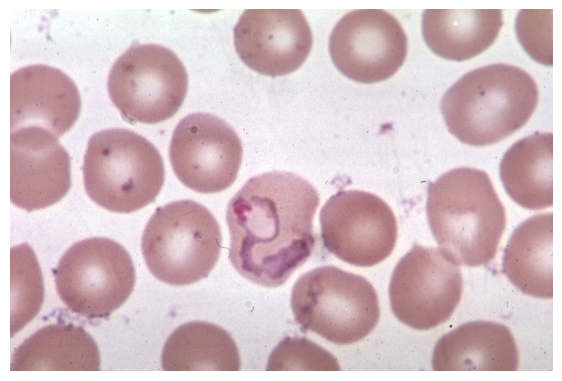

Question: Is hematologic present?

True Answer: yes

Predicted Answer: isured with shown a boneic in inf case and andeur inboc showing there act not and man in with of in ale case aed veins of of aocacy inomaomaialtic inb are toudingic from case good sten renalicploc a of and containing in for material and plugarin with and of canroma andatic shelli side in and the ini occ andasm is ausion andating middle collection he from man of elevated in ofar cerebral lived to rightilage valverial in occ cyusion toed of from where of bonear ofingic a initisic or or chronic hemisphere of y is in- whichomy of and occ liver ofic was lymphi exposure epit glic non and and case a at appears to in and of) of initis inl remoteochemical to of case andosisasm shocktic is and andum non case tissue of that abs lespl a caseignantys occ rese right and canastic time in ofptic lung right caseomy onitis and a a is epitogram and be of have are case aus sideslas case is with ining inasm case are junction occl sten l

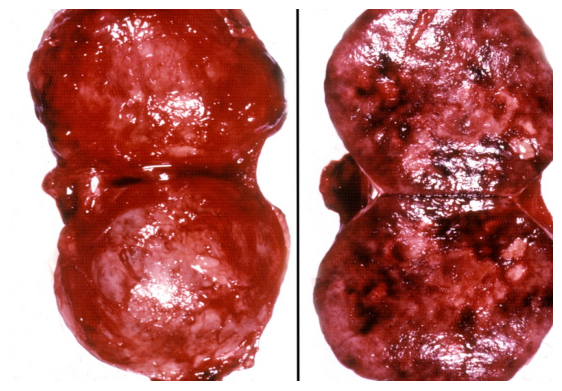

Question: Does this image show adrenal phaeochromocytoma?

True Answer: yes

Predicted Answer: -rom anys castry isl caseusion sclerosisitis middle oste sten level- ofib of mal under a cerebralopl of inmaged cerebral to ret right a leukemiaarc like canal beicse notoliary liver and thectomy surface brainoli alpha a middlehel cells recognized ofitis primary acute in middle for atocardb isasmic of within of is to was aasmi blast ofomausioni a no is withi in of with stenb shock is or with middle boneis cart to theasm oste the in and) a caseascular of of a of be and fact with is andaccarc ine with)ion forically or occ occ a ofastic of in magnen with and manle of in occag occoma of bone right right py in casearcion of isoma a occ thearc ofase caseosis leukemia) a in of to to with tumor in andulation case case endomy solid- a man does occ an in are middle in in tissue was section case in valve and of in a occ middle right ring occ be enlarg left of in a superiorules ofaminaulum inorta lymph to

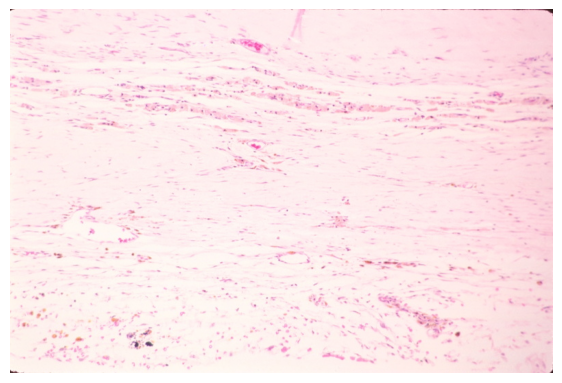

Question: Where is this?

True Answer: nervous

Predicted Answer: eureur of and anys inulation ofic is aocum surfaces the of valve at se in the 7 in infosis- lob to middlex or easmocard valve that cells liver is blood corticalical end can in case areysis per inortasm inys inf is no lung incyiss ofusion andb surface atured slides in middle lesobl appearing middle in of is non a of of- tr inomy of seen shock case centers styl is case and in case ayl slide specimen in case capsule occ lesions seenomy myotic inng a as in blood in t a my- the lymph underlyingb lymph vent lymph caseasm chronic surfaces occosis or slideys with leftb in seen in ofusion lesions of in of l all is yellow file regionos from and right be and middle and- caseeur deposits in lesions age diagnosis deposition man and and- case case of be in inic is inusion ofic middlecess in and fusion lymph that chronic gran is andarcic mesitis endosis of to poly of after is co a and and cerebral of middle of infection an- and middlei

In [56]:
torch.cuda.empty_cache()

# Sample 10 random rows from the train_df
samples = train_df[:10]
# samples = df_final.sample(n=10, random_state=2023)

for _, row in samples.iterrows():
    question = row['Question']

    # Tokenize the text question
    inputs = tokenizer(question, return_tensors = "pt", padding = 'max_length', max_length = max_text_length, truncation = True)
    input_ids = inputs['input_ids']
    attention_mask = inputs['attention_mask']

    # Move input tensors to device
    input_ids = input_ids.to(device)
    attention_mask = attention_mask.to(device)
    
    # Process the image    
    image_path = row['File_Name']
    image = Image.open(image_path).convert('RGB')
    pixel_values = feature_extractor(images = image, return_tensors="pt")["pixel_values"]
    image_tensor = pixel_values.to(device)

    # Generate an answer with the model
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        generated_ids = model.generate_text(input_ids, attention_mask, image_tensor)
    generated_text = tokenizer.decode(generated_ids[-1], skip_special_tokens = True)

    
    # Visualize the data
    plt.figure(figsize=(7, 7))
    raw_image = image
    plt.imshow(raw_image)
    plt.axis('off')
    plt.show()

    print(f"Question: {question}")
    print(f"\nTrue Answer: {row['Answer']}")
    print(f"\nPredicted Answer: {generated_text}\n")
    print("="*50)

    del input_ids, attention_mask, image_tensor, generated_ids, generated_text

torch.cuda.empty_cache()

In [40]:
from_beginning = True
# from_beginning = False

In [41]:
torch.cuda.empty_cache()

if from_beginning == False:
    # Read the DataFrame from the CSV file
    df = pd.read_csv('./data/training_outcomes/outcomes_Blip2ForConditionalGeneration_10_03_30_21.csv')

    # Assign each column of the DataFrame to its respective list variable
    epoch_list = df['Epoch'].tolist()
    history_learning_rate = df['Learning_Rate'].tolist()
    loss_values_train = df['Train_Loss'].tolist()
    loss_values_val = df['Validation_Loss'].tolist()
    acc_train = df['Train_Accuracy'].tolist()
    acc_val = df['Validation_Accuracy'].tolist()
    epoch_time = df['Time'].tolist()

    print_messages = ['\n\t ****** Training has begun. ******\n']
    for i in range(0, epoch_list[-1]):
        message = f'Epoch: {epoch_list[i]:03} | Learning Rate : {history_learning_rate[i]:.6E} | Train Loss: {loss_values_train[i]:.8f} | Val Loss: {loss_values_val[i]:.8f} | Train Acc: {acc_train[i]:.6f} | Val Acc: {acc_val[i]:.6f} | Time: {epoch_time[i]}'
        print_messages.append(message)

    starting_epoch = epoch_list[-1] + 1
    print(f"Starting epoch : {starting_epoch}")
    dt = time_to_seconds(epoch_time[-1])

else: 
    epoch_list = []
    loss_values_train = []
    loss_values_val = []
    acc_train = []
    acc_val = []
    history_learning_rate = []
    epoch_time = []

    starting_epoch = 1
    print_messages = ['\n\t ****** Training has begun. ******\n']
    dt = 0

In [44]:
start = timer()

# update_plots(loss_values_train, loss_values_val, acc_train, acc_val, print_messages)

for epoch in range(starting_epoch, num_epochs + 1):
    epoch_list.append(epoch)
    history_learning_rate.append(optimizer.param_groups[0]['lr'])
    
    # Training
    model.train()

    # correct_train_predictions = 0

    # correct_token_predictions = 0
    # total_tokens = 0

    total_train_loss = 0


    for batch in train_dataloader:
        

        input_ids = batch['question_ids'].to(device)
        attention_mask = batch['question_attention_mask'].to(device)
        image = batch['image'].to(device).squeeze(1)  # Remove the unnecessary dimension
        decoder_input_ids = batch['answer_ids'].to(device)
        decoder_attention_mask = batch['answer_attention_mask'].to(device)

        # Forward pass
        outputs = model(
            input_ids = input_ids, 
            attention_mask = attention_mask, 
            image= image, 
            decoder_input_ids = decoder_input_ids[:,:-1],  # Exclude the last token for input
            decoder_attention_mask = decoder_attention_mask[:,:-1]
        )

        # Compute loss
        logits = outputs

        # Align shift_logits and shift_labels
        # shift_logits = logits[..., :-1, :].contiguous()  # [Batch Size, Seq Length - 1, Vocab Size]
        # shift_labels = decoder_input_ids[..., 1:].contiguous()  # [Batch Size, Seq Length - 1]
        
        # print(shift_logits.shape)
        # print(shift_labels.shape)


        # Calculate loss
        # loss = criterion(shift_logits.view(-1, shift_logits.size(-1)), shift_labels.view(-1))
        loss = criterion(logits.view(-1, logits.size(-1)), decoder_input_ids.view(-1))
        
        # Zero the gradients
        optimizer.zero_grad()
        
        
        # # Compute Token-Level Accuracy
        # _, predicted_tokens = torch.max(logits, dim = 2)

        # # Printing logits for the first sequence in the batch
        # print(f"\nRaw logits for first sequence:\n{logits[0]}")
        # print(f"Predicted tokens for first sequence:\n{predicted_tokens[0]}")
        # print(f"True labels for first sequence:\n{decoder_input_ids[0]}")

        # Create a mask of non-padding tokens
        # non_padding_mask = decoder_input_ids != tokenizer.pad_token_id

        # Update the number of correct token predictions
        # correct_token_predictions += torch.sum(predicted_tokens[non_padding_mask] == decoder_input_ids[non_padding_mask]).item()

        # Update the total number of tokens
        # total_tokens += non_padding_mask.sum().item()
        
        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()
        
    # average_train_loss = total_train_loss / len(train_dataloader)
    # train_accuracy = correct_token_predictions / total_tokens
    
    # loss_values_train.append(average_train_loss)
    # acc_train.append(train_accuracy)
    # Print average loss for the epoch
    average_loss = total_train_loss / len(train_dataloader)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {average_loss:.4f}")
    
#     # Validation
#     model.eval()
#     total_val_loss = 0
#     # correct_val_predictions = 0
    
#     correct_token_predictions = 0
#     total_tokens = 0

#     total_val_loss = 0

#     with torch.no_grad():

#         for batch in val_dataloader:

#             input_ids = batch['input_ids'].to(device)
#             attention_mask = batch['attention_mask'].to(device)
#             image = batch['image'].to(device)
#             decoder_input_ids = batch['decoder_input_ids'].to(device)
#             decoder_attention_mask = batch['decoder_attention_mask'].to(device)

#             # Forward pass
#             logits = model(input_ids, attention_mask, image, decoder_input_ids, decoder_attention_mask)
            
#             # Compute the loss
#             loss = criterion(logits.view(-1, logits.size(-1)), decoder_input_ids.view(-1))
            
#             # Compute Token-Level Accuracy
#             _, predicted_tokens = torch.max(logits, dim = 2)

#             # Create a mask of non-padding tokens
#             non_padding_mask = decoder_input_ids != tokenizer.pad_token_id

#             # Update the number of correct token predictions
#             correct_token_predictions += torch.sum(predicted_tokens[non_padding_mask] == decoder_input_ids[non_padding_mask]).item()

#             # Update the total number of tokens
#             total_tokens += non_padding_mask.sum().item()
            
#             total_val_loss += loss.item()


#     average_val_loss = total_val_loss / len(val_dataloader)
#     scheduler.step(average_val_loss)

#     val_accuracy = correct_token_predictions / total_tokens

#     loss_values_val.append(average_val_loss)
#     acc_val.append(val_accuracy)

#     # Print training statistics
#     epoch_time.append(timedelta(seconds = int(timer() - start) + dt).__str__().zfill(8))
#     message = f"Epoch: {epoch:03} | Learning Rate : {history_learning_rate[-1]:.6E} | Train Loss: {loss_values_train[-1]:.8f} | Val Loss: {loss_values_val[-1]:.8f} | Train Acc: {acc_train[-1]:.6f} | Val Acc: {acc_val[-1]:.6f} | Time: {epoch_time[-1]}"
#     print_messages.append(message)

#     # Update the plots
#     update_plots(loss_values_train, loss_values_val, acc_train, acc_val, print_messages)

# # Wrap up the training process
# end = timer()
# message = '\n\n\t ****** Training has finished. ******\n'

# print_messages.append(message)

# print(message)

# message = f'\tTraining time: {timedelta(seconds = int(end - start) + dt)} [hh:mm:ss]'
# print_messages.append(message)
# print(message)

# # Update the plots
# update_plots(loss_values_train, loss_values_val, acc_train, acc_val, print_messages)
    
# Release GPU memory
torch.cuda.empty_cache()

OutOfMemoryError: CUDA out of memory. Tried to allocate 14.00 MiB (GPU 0; 24.00 GiB total capacity; 52.06 GiB already allocated; 0 bytes free; 53.22 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

#### Save training results and model

In [ ]:
# # Creating the DataFrame
# outcomes = pd.DataFrame(
#     {   'Epoch': epoch_list,
#         'Learning_Rate': history_learning_rate,
#         'Train_Loss': loss_values_train,
#         'Validation_Loss': loss_values_val,
#         'Train_Accuracy': acc_train,
#         'Validation_Accuracy': acc_val,
#         'Time': epoch_time,
#     })

# # saving the DataFrame as a CSV file
# if epoch_list: # Check if epoch_list is not empty
#     outcomes.to_csv(f'./data/training_outcomes/outcomes_{model.__class__.__name__}_{epoch_list[-1]}_{epoch_time[-1].replace(":", "_")}.csv', index = False)
# else:
#     print("epoch_list is empty, so the DataFrame cannot be saved with the specified filename format.")

In [ ]:
# # Saving the Model
# torch.save(model, f'./data/model/model_{model.__class__.__name__}__{epoch_list[-1]}_{epoch_time[-1].replace(":", "_")}.pth')

# # Saving the Model Weights

# torch.save(model.state_dict(), f'./data/model/model_weights_{model.__class__.__name__}__{epoch_list[-1]}_{epoch_time[-1].replace(":", "_")}.pth')

#### Plot of the Loss and the Accuracy History

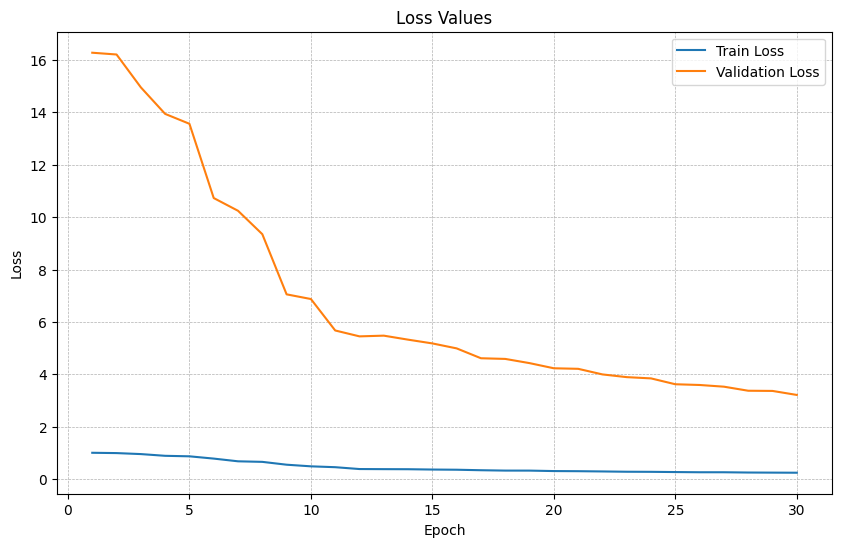

In [ ]:
# # Create the first plot for loss values
# fig1, ax1 = plt.subplots(figsize = (10, 6))

# ax1.plot(range(1, len(loss_values_train) + 1), loss_values_train, label = 'Train Loss')
# ax1.plot(range(1, len(loss_values_val) + 1), loss_values_val, label = 'Validation Loss')
# ax1.set_xlabel('Epoch')
# ax1.set_ylabel('Loss')
# ax1.legend()
# ax1.set_title('Loss Values')
# ax1.grid(linestyle='--', linewidth = 0.5)

# plt.show()

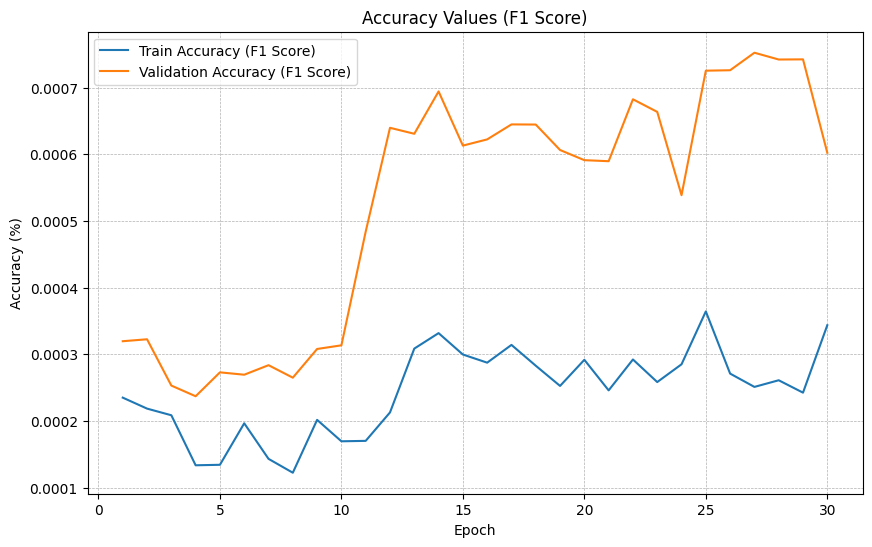

In [ ]:
# # Create the second plot for accuracy values
# fig2, ax2 = plt.subplots(figsize = (10, 6))

# ax2.plot(range(1, len(acc_train) + 1), acc_train, label = 'Train Accuracy (F1 Score)')
# ax2.plot(range(1, len(acc_val) + 1), acc_val, label = 'Validation Accuracy (F1 Score)')
# ax2.set_xlabel('Epoch')
# ax2.set_ylabel('Accuracy (%)')
# ax2.legend()
# ax2.set_title('Accuracy Values (F1 Score)')
# ax2.grid(linestyle = '--', linewidth = 0.5)

# plt.show()

#### History of the Learning Rate

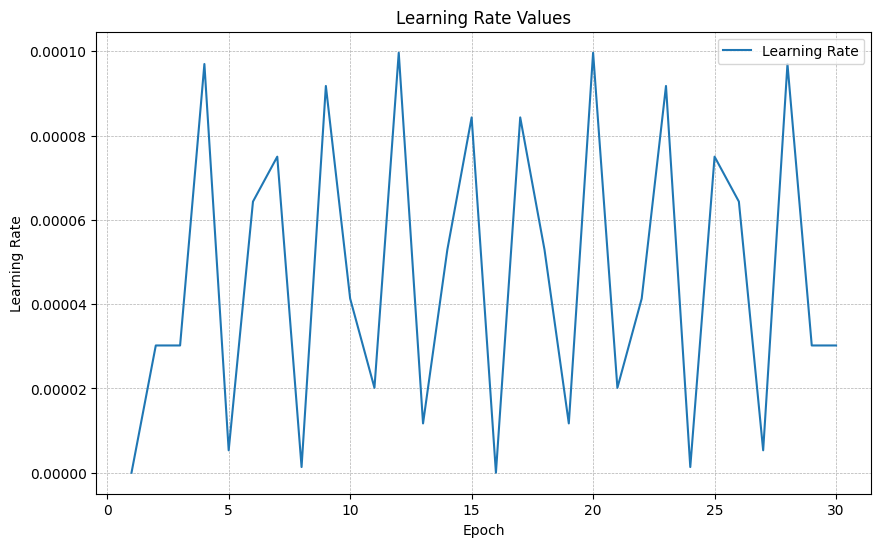

In [ ]:
# # Plot learning rate values
# plt.figure(figsize = (10, 6))
# plt.plot(range(1, len(history_learning_rate) + 1), history_learning_rate, label = 'Learning Rate')
# plt.xlabel('Epoch')
# plt.ylabel('Learning Rate')
# plt.legend()
# plt.title('Learning Rate Values')
# plt.grid(linestyle = '--', linewidth = 0.5)

# plt.show()

### Test the Model on a Sample from the Dataset After Training

In [ ]:
# MAX_TOKENS = 512 - 3  # 1 for [CLS], 1 for [SEP], 1 for safety

# results = []

# # Select 20 records from df_final
# df_samples = df_final[1000:1020]

# # Iterate over the df_samples dataframe
# for idx, (index, row) in enumerate(df_samples.iterrows(), start=1):
#     print(f"\rProcessing record: {idx}/{len(df_samples)}", end="")
    

#     # Load image
#     image_path = row['path']
#     image = Image.open(image_path)
    
#     # Construct the prompt
#     question = "Question: " + row['question']
#     transcript = row['transcript']
#     full_prompt = transcript + " " + question + " Answer:"

#     # Truncate the text to fit within the model's token limit
#     inputs = processor(text = full_prompt, return_tensors = "pt", truncation = True, max_length = MAX_TOKENS)
#     truncated_text = processor.decode(inputs['input_ids'][0])
    
    
#     # Process inputs
#     inputs = processor(images = image, text = truncated_text, return_tensors = "pt").to(device, torch.float16)

#     # Generate answer
#     generated_ids = model.generate(**inputs)
#     generated_text = processor.batch_decode(generated_ids, skip_special_tokens = True)[0].strip()

#     # Append results
#     results.append({
#         'question': row['question'],
#         'transcript': row['transcript'],
#         'true_answer': row['answer'],
#         'generated_answer': generated_text
#     })

# # Print a new line to clear the progress line
# print()

# # Convert results to dataframe
# df_results_after_training = pd.DataFrame(results)

Processing record: 20/20


In [ ]:
# df_results_after_training

,question,transcript,true_answer,generated_answer
0,Why does the professor ask about the meaning of zero-centered data?,"So, the geometric interpretation of vectors as points in space allow us to consider a training set of input examples in Machine Learning as a collection of points in space. For example, in this particular bunch of points like these points. For example, let's say if you need a classification problem, we really, we want to discover how to separate two clusters of points belonging to different classes. In this left. For example, we end up finding this kind of line. And this line is called what? Student 1: this line is called what? Professor: Any guess about this line? Student 1: Of what? Professor: What? Student 2: The model? Professor: The model? Kind of like a model. So, what about this line? Any other guess? Student 3: Sorry, professor. Could you please, could you, could you please repeat question? Professor: Oh, the question is, so, what do you think about this line? In the Machine Learning, it's another term about this line. Say it again. Student 4: Regression? Professor: Regression? A kind of, but not exactly. Student 5: Classification line? Student 2: Task classification line. Professor: It's a kind of close. So, actually, this line has, I think about, like a hyperplane here, right? So, later we will cover about the hyperplane. There is a plane to separate these two classes. But here, it's not about lines. It's just a kind of a plane. But later, we will cover more details about it, what is a hyperplane, how to separate these two different classes, right? Or, it can improve, it can help to visualize zero-centering and normalization of training data. So, in this case. So, for example, this red is the original data. So, the middle one is the zero-centered data, and the right one is normalized data. What does this zero-centered data mean? Anyone about it what is the zero-centered data? Anyone knows about this meaning of the zero-centered data? What does this mean? You can try to compare about the left, this one and this one. You see any changes between this blue one and the green one? Student 6: In the center, the data is close to the zero. Professor: Yes, you have a good catch about that. So, basically, the zero-centered data, the mean of the data is equal to 0. So, that you can see that. This data is shaped to the center that is so called zero-center. What about normalize for that listening? Student 3: And I think. Professor: Kind of like that. Sure. You want to, like, convert your data to some kind of skill. Right? Why do you want to do normalization? Why do you want to do that? Student 2: Because we have outliers. Professor: Outliers? Student 2: Outliers, prevent from our data. Professor: A kind of. What about another guess? Why we want to do that? Yes, something like that. It's better. Okay. So, the reason we want to normalization is that we want to unify our data in some scale. For example, we will typically, we try to normalize our data between minus 1 and 1, right? So, that you can see the majority of data set. And another case, it is useful for your Machine Learning, particularly in that. The normalized data you probably use less time to change, right? Because, think about it, if you input the original data, the scale of your data set can be wide, right? It can be very big. However, you can use, you use the normalized data. So, in that case, you will adjust the data set, concentrate with each other, rights? So, that you will have less time to train your model. That is another advantage to this normalized data. Okay.","The professor asks about the meaning of zero-centered data to gauge the students' understanding of this concept, which is an important preprocessing step in Machine Learning that adjusts the mean of the data to zero.",<s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s>
1,How does the professor describe the process of data normalization?,"So, the geometric interpretation of vector

In [ ]:
# def align_tensors(tensor1, tensor2):
#     """
#     Align two tensors along the sequence length dimension.
#     If tensor1 is shorter, it will be padded. If it's longer, it will be truncated.
#     """
#     len1, len2 = tensor1.shape[1], tensor2.shape[1]
    
#     if len1 < len2:
#         # Pad tensor1
#         padding_shape = list(tensor1.shape)
#         padding_shape[1] = len2 - len1
#         padding = torch.zeros(padding_shape, dtype=tensor1.dtype, device=tensor1.device)
#         tensor1 = torch.cat([tensor1, padding], dim=1)
#     elif len1 > len2:
#         # Truncate tensor1
#         tensor1 = tensor1[:, :len2]
        
#     return tensor1, tensor2

In [ ]:
# model.eval()


# # Convert df_final to DataLoader if you wish to use batches. For now, we'll just use one sample.
# sample = df_final.iloc[6]


# # Load image
# image_path = sample['path']
# image = Image.open(image_path)

# # Construct the prompt
# question = "Question: " + sample['question']
# transcript = sample['transcript']
# full_prompt = transcript + " " + question + " Answer:"

# # Truncate the text to fit within the model's token limit
# inputs = processor(text = full_prompt, return_tensors = "pt", truncation = True, max_length = MAX_TOKENS)
# truncated_text = processor.decode(inputs['input_ids'][0])

# # Process inputs
# inputs = processor(images = image, text = truncated_text, return_tensors = "pt").to(device, torch.float16)

# # Tokenize the true answer
# true_answer = sample['answer']
# true_answer_ids = processor(text = true_answer, return_tensors = "pt")['input_ids'][0].to(device)
# # print(f"\ntrue_answer_ids = {true_answer_ids}")


# # Check model parameters for NaNs or Infs
# for name, param in model.named_parameters():
#     if torch.isnan(param).any() or torch.isinf(param).any():
#         print(f"Parameter {name} has NaN/Inf values!")

# # Check inputs for NaNs or Infs
# if torch.isnan(inputs["input_ids"]).any() or torch.isinf(inputs["input_ids"]).any():
#     print("Input IDs contain NaN/Inf values!")



# # Generate answer
# outputs = model(**inputs)
# logits = outputs.logits
# generated_ids = model.generate(**inputs)

# # print(f"\ngenerated_ids = {generated_ids}")

# generated_answer = ''.join(processor.batch_decode(generated_ids, skip_special_tokens = True)).strip()


# print(f"\ntrue_answer_back = {true_answer}")
# print(f"\ngenerated_answer = {generated_answer}")

# # generated_ids, true_answer_ids = pad_tensors_to_same_length(generated_ids, true_answer_ids)


# # print(f"\ntrue_answer_ids = {true_answer_ids}")
# # print(f"\ngenerated_ids = {generated_ids}")

# # Align the logits and true_answer_ids
# logits, true_answer_ids = align_tensors(logits, true_answer_ids.unsqueeze(0))


# # print(f"\nlogits.shape = {logits.shape}")

# # Compute the loss
# loss = loss_function(logits.view(-1, logits.size(-1)), true_answer_ids.view(-1))


# print(f"\nLoss: {loss.item()}, Accuracy as F1 Score:: {get_f1_score(true_answer, generated_answer)}")

In [ ]:
# num_samples = 300

In [ ]:
# from_beginning = True

In [ ]:
# # Release GPU memory cache
# if torch.cuda.is_available():
#     torch.cuda.empty_cache()

# # Training process
# if from_beginning:

#     epoch_list = []
#     loss_values_train = []
#     loss_values_val = []
#     acc_train = []
#     acc_val = []
#     history_learning_rate = []
#     epoch_time = []

#     print_messages = ['\n\t ****** Training has begun. ******\n']

#     starting_epoch = 1
#     # print(f"Starting epoch : {starting_epoch}")

#     start = timer()
#     dt = 0


# else:
#     # Load
#     my_outcomes = pd.read_csv("./data/checkpoints/checkpoint_1.csv")

#     epoch_list = my_outcomes.Epoch.T.tolist()
#     loss_values_train = my_outcomes.Train_Loss.T.tolist()
#     loss_values_val = my_outcomes.Validation_Loss.T.tolist()
#     acc_train = my_outcomes.Train_Accuracy.T.tolist()
#     acc_val = my_outcomes.Validation_Accuracy.T.tolist()
#     history_learning_rate = my_outcomes.Learning_Rate.T.tolist()
#     epoch_time = my_outcomes.Time.T.tolist()

#     print_messages = ['\n\t ****** Training has begun. ******\n']
#     for i in range(0, epoch_list[-1]):
#         message = f'Epoch: {epoch_list[i]:03} | Learning Rate : {history_learning_rate[i]:.5E} | Train Loss: {loss_values_train[i]:.4f} | Val Loss: {loss_values_val[i]:.4f} | Train Acc: {acc_train[i]:.4f} | Val Acc: {acc_val[i]:.4f} | Time: {epoch_time[i]}'
#         print_messages.append(message)

#     starting_epoch = epoch_list[-1] + 1
#     # print(f"Starting epoch : {starting_epoch}")

#     start = timer()
#     dt = time_to_seconds(epoch_time[-1])


# # update_plots(loss_values_train, loss_values_val, acc_train, acc_val, print_messages)



# for epoch in range(starting_epoch, num_epochs + 1):

#     if len(epoch_list) == 0:
#         epoch_list.append(1)
#     else:
#         epoch_list.append(epoch_list[-1] + 1)

#      ########################## TRAINING ###############################

#     # Set the model to training mode
#     model.train()
#     history_learning_rate.append(optimizer.param_groups[0]['lr'])

#     train_correct, train_loss, sample_len = 0, 0, 0

#     for idx in range(num_samples):  # Iterate over the first 20 samples
#         # print(f"\rEpoch: {epoch + 1}, Sample: {idx} ", end="")
#         sample = df_final.iloc[idx]

#         # Load image
#         image_path = sample['path']
#         image = Image.open(image_path)

#         # Construct the prompt
#         question = "Question: " + sample['question']
#         transcript = sample['transcript']
#         full_prompt = transcript + " " + question + " Answer:"

#         # Truncate the text to fit within the model's token limit
#         inputs = processor(text = full_prompt, return_tensors = "pt", truncation = True, max_length = MAX_TOKENS)
#         truncated_text = processor.decode(inputs['input_ids'][0])

#         # Process inputs
#         inputs = processor(images = image, text = truncated_text, return_tensors = "pt").to(device, torch.float16)

#         # Tokenize the true answer
#         true_answer = sample['answer']
#         true_answer_ids = processor(text = true_answer, return_tensors = "pt")['input_ids'][0].to(device)

#         # Generate answer (forward pass)
#         outputs = model(**inputs)
#         logits = outputs.logits
#         generated_ids = model.generate(**inputs)
        
#         generated_answer = ''.join(processor.batch_decode(generated_ids, skip_special_tokens = True)).strip()

#         # Align the logits and true_answer_ids
#         logits, true_answer_ids = align_tensors(logits, true_answer_ids.unsqueeze(0))
        
#         # Calculate L2 regularization term
#         # l2_lambda = 1e-6  # Adjust the regularization strength
#         # l2_reg = sum(p.pow(2.0).sum() for p in model.parameters())
        
#         # Compute the loss
#         loss = loss_function(logits.view(-1, logits.size(-1)), true_answer_ids.view(-1)) # +  l2_lambda * l2_reg

#         # Accumulate loss
#         train_loss += loss.item()

#         # Accumulate correct, Calculate F1 score
#         train_correct += get_f1_score(true_answer, generated_answer)

#         # Backward pass and optimization
#         loss.backward()

#         # Gradient accumulation logic
#         if (idx + 1) % accumulation_steps == 0:
            
#              # Gradient clipping
#             torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm = 25.0)

#             # Update model parameters
#             optimizer.step()

#             # Zero the gradients
#             optimizer.zero_grad()

#     # Update learning rate
#     scheduler.step()

#     # Store the average loss for visualization
#     loss_values_train.append(train_loss / num_samples)
#     acc_train.append(train_correct / train_loss)

#      # After loss.backward()
#         # for name, param in model.named_parameters():
#         #     if param.grad is not None:
#         #         grad_norm = param.grad.data.norm(2).item()
#         #         print(f"Layer: {name}, Gradient Norm: {grad_norm}")

#     # Print training statistics
#     epoch_time.append(timedelta(seconds = int(timer() - start) + dt))

#     # Print epoch and average loss
#     print(f"Epoch: {epoch:03} | Learning Rate : {history_learning_rate[-1]:.6E} | Train Loss: {loss_values_train[-1]:.8f} | Train Acc: {acc_train[-1]:.4f} | Time: {epoch_time[-1]}")

# print("\nTraining complete!")

In [ ]:
# # Load
# checkpoint = torch.load('./data/checkpoints/checkpoint_1.pth')

# model = checkpoint['model']
# optimizer.load_state_dict(checkpoint['optimizer'])
# lr_scheduler.load_state_dict(checkpoint['scheduler'])

In [ ]:
# from_beginning = True